# Семинар 1. Оптимизация как основа машинного обучения

**Цель семинара**

1. Увидеть, что обучение модели — это задача минимизации, и что способ её решения (формула, разложение, итерации) определяет и точность, и время.
2. Собрать единый каркас ERM: одна функция потерь, четыре варианта `loss`/`grad`, один интерфейс для всех методов.
3. Понять, что скорость обучения определяется геометрией ландшафта (число обусловленности), а не количеством данных.


## План на 80 минут

| Время | Блок              | Что делаем                                                                               |
| ----- | ----------------- | ---------------------------------------------------------------------------------------- |
| 0–8   | Мотивация         | Линейная регрессия тремя способами: нормальное уравнение, SVD, `scipy.optimize.minimize` |
| 8–15  | Теория-минимум    | ERM, четыре функции потерь и их градиенты, гессиан, шаг $2/L$                            |
| 15–30 | Реализация с нуля | `loss`/`grad` для MSE, MAE, Huber, logloss; проверка градиентов; GD с единым интерфейсом |
| 30–40 | Ландшафты         | Линии уровня и 3D-поверхности; негладкость MAE против гладкости Huber                    |
| 40–52 | Обусловленность   | Данные с заданным $\kappa$, число итераций до сходимости, траектории                     |
| 52–60 | Выбросы и масштаб | MSE / MAE / Huber на данных с выбросами; `StandardScaler` и его влияние на $\kappa$      |
| 60–70 | Сравнение методов | `BFGS`, `CG`, `Nelder-Mead`, `Powell` $\times$ $\kappa$: таблица и heatmap               |
| 70–80 | Как ломается      | Почти коллинеарные признаки, `solve` против `lstsq`; задачи для самостоятельной работы   |


## 1. Setup

Одна ячейка: импорты, seed, настройки графиков и вспомогательные функции, которыми пользуемся весь семинар.
Интерфейс всех методов оптимизации в ноутбуке единый:

```python
def method(f, grad, x0, **params) -> tuple[np.ndarray, dict]
```

где второй элемент — история: `x`, `f`, `grad_norm`, `time`.


In [1]:
from __future__ import annotations

import time
import warnings
from collections.abc import Callable

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from IPython.display import HTML
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401  (регистрирует projection="3d")
from scipy import optimize

SEED = 42
rng = np.random.default_rng(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
warnings.filterwarnings("ignore", category=RuntimeWarning)

plt.rcParams.update(
    {
        "figure.dpi": 110,
        "axes.grid": True,
        "grid.alpha": 0.3,
        "axes.titlesize": 11,
        "axes.labelsize": 10,
        "legend.fontsize": 9,
        "font.size": 10,
    }
)

Scalar = Callable[[np.ndarray], float]
Vector = Callable[[np.ndarray], np.ndarray]

PALETTE = ["#1f77b4", "#d62728", "#2ca02c", "#9467bd", "#ff7f0e", "#17becf"]
MARKERS = ["o", "s", "^", "D", "v", "P"]


def check_gradient(f: Scalar, grad: Vector, x: np.ndarray, eps: float = 1e-6) -> float:
    """Максимальное расхождение аналитического градиента с центральной разностью."""
    x = np.asarray(x, dtype=float)
    numeric = np.empty_like(x)
    for i in range(x.size):
        step = np.zeros_like(x)
        step[i] = eps
        numeric[i] = (f(x + step) - f(x - step)) / (2 * eps)
    return float(np.max(np.abs(numeric - grad(x))))


def condition_number(H: np.ndarray) -> float:
    """Число обусловленности симметричной матрицы через её собственные числа."""
    eigs = np.linalg.eigvalsh(H)
    return float(eigs.max() / eigs.min())


def mse_hessian(X: np.ndarray) -> np.ndarray:
    """Гессиан MSE-задачи: H = (2/n) X^T X (не зависит от w)."""
    return 2.0 / X.shape[0] * (X.T @ X)


def loss_surface(
    f: Scalar, xlim: tuple[float, float], ylim: tuple[float, float], n_grid: int = 90
) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Значения двумерной функции на прямоугольной сетке (для линий уровня и 3D)."""
    xs = np.linspace(xlim[0], xlim[1], n_grid)
    ys = np.linspace(ylim[0], ylim[1], n_grid)
    XX, YY = np.meshgrid(xs, ys)
    pts = np.stack([XX.ravel(), YY.ravel()], axis=1)
    ZZ = np.array([f(p) for p in pts]).reshape(XX.shape)
    return XX, YY, ZZ


def draw_contours(
    ax: plt.Axes,
    XX: np.ndarray,
    YY: np.ndarray,
    ZZ: np.ndarray,
    n_levels: int = 22,
    power: float = 3.0,
) -> None:
    """Линии уровня со сгущением около минимума (contourf + contour)."""
    lo, hi = float(ZZ.min()), float(ZZ.max())
    levels = lo + (hi - lo) * np.linspace(0.0, 1.0, n_levels) ** power
    levels = np.unique(levels)
    ax.contourf(XX, YY, ZZ, levels=levels, cmap="viridis", alpha=0.75)
    ax.contour(XX, YY, ZZ, levels=levels, colors="k", linewidths=0.4, alpha=0.5)
    ax.set_xlabel("$w_1$")
    ax.set_ylabel("$w_2$")


def draw_trajectory(
    ax: plt.Axes,
    xs: np.ndarray,
    label: str,
    color: str,
    marker: str = "o",
    n_arrows: int = 8,
) -> None:
    """Траектория метода поверх линий уровня: точки итераций, стрелки, старт квадратом."""
    xs = np.asarray(xs)
    ax.plot(
        xs[:, 0],
        xs[:, 1],
        marker=marker,
        color=color,
        ms=3.5,
        lw=1.2,
        alpha=0.9,
        label=label,
    )
    step = max(1, len(xs) // n_arrows)
    for i in range(0, len(xs) - step, step):
        if np.linalg.norm(xs[i + step] - xs[i]) < 1e-12:
            continue
        ax.annotate(
            "",
            xy=xs[i + step],
            xytext=xs[i],
            arrowprops=dict(arrowstyle="->", color=color, lw=1.3, alpha=0.9),
        )
    ax.scatter(
        [xs[0, 0]], [xs[0, 1]], marker="s", s=70, color=color, edgecolor="k", zorder=5
    )


def mark_optimum(ax: plt.Axes, w_star: np.ndarray, label: str = "оптимум") -> None:
    """Помечает оптимум звёздочкой."""
    ax.scatter(
        [w_star[0]],
        [w_star[1]],
        marker="*",
        s=260,
        color="gold",
        edgecolor="k",
        zorder=6,
        label=label,
    )


def plot_convergence(
    histories: dict[str, dict], f_star: float = 0.0, suptitle: str = ""
) -> None:
    """Два графика в логарифмической шкале: f(x_k) - f* и ||grad_k||."""
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    for i, (name, h) in enumerate(histories.items()):
        gap = np.maximum(np.asarray(h["f"]) - f_star, 1e-18)
        gnorm = np.maximum(np.asarray(h["grad_norm"]), 1e-18)
        it = np.arange(len(gap))
        every = max(1, len(it) // 12)
        color, marker = PALETTE[i % len(PALETTE)], MARKERS[i % len(MARKERS)]
        axes[0].semilogy(
            it,
            gap,
            color=color,
            marker=marker,
            markevery=every,
            ms=4,
            lw=1.4,
            label=name,
        )
        axes[1].semilogy(
            it,
            gnorm,
            color=color,
            marker=marker,
            markevery=every,
            ms=4,
            lw=1.4,
            label=name,
        )
    axes[0].set_xlabel("итерация $k$")
    axes[0].set_ylabel(r"$f(x_k) - f^*$")
    axes[0].set_title("Невязка по функции")
    axes[1].set_xlabel("итерация $k$")
    axes[1].set_ylabel(r"$\|\nabla f(x_k)\|_2$")
    axes[1].set_title("Норма градиента")
    for ax in axes:
        ax.legend()
    if suptitle:
        fig.suptitle(suptitle)
    fig.tight_layout()
    plt.show()


print("numpy", np.__version__, "| torch", torch.__version__, "| seed =", SEED)

numpy 2.5.2 | torch 2.13.0 | seed = 42


## 2. Мотивирующая задача: линейная регрессия тремя способами

Задача одна и та же: $\min_w \frac{1}{n}\|Xw - y\|_2^2$. Путей три.

1. **Нормальное уравнение**: решаем $(X^\top X)\,w = X^\top y$ через `np.linalg.solve`.
2. **Псевдообратная через SVD**: `np.linalg.lstsq` — раскладывает сам $X$, не трогая $X^\top X$.
3. **Численная минимизация**: `scipy.optimize.minimize` — не знает, что задача квадратичная, просто идёт по градиенту.

Сначала на «хороших» данных всё работает. Потом ломаем ровно один параметр — обусловленность $X$ — и один из путей рассыпается.


In [2]:
def solve_normal_equation(X: np.ndarray, y: np.ndarray) -> np.ndarray:
    """Путь 1: явно собираем X^T X и решаем систему."""
    return np.linalg.solve(X.T @ X, X.T @ y)


def solve_svd(X: np.ndarray, y: np.ndarray) -> np.ndarray:
    """Путь 2: псевдообратная через SVD (np.linalg.lstsq работает с самим X)."""
    return np.linalg.lstsq(X, y, rcond=None)[0]


def solve_numeric(X: np.ndarray, y: np.ndarray) -> np.ndarray:
    """Путь 3: численная минимизация MSE методом BFGS, без формул решения."""
    n = X.shape[0]

    def f(w: np.ndarray) -> float:
        return float(np.mean((X @ w - y) ** 2))

    def grad(w: np.ndarray) -> np.ndarray:
        return 2.0 / n * X.T @ (X @ w - y)

    res = optimize.minimize(
        f,
        np.zeros(X.shape[1]),
        jac=grad,
        method="BFGS",
        options={"gtol": 1e-12, "maxiter": 5000},
    )
    return res.x


def compare_solvers(X: np.ndarray, y: np.ndarray, w_true: np.ndarray) -> pd.DataFrame:
    """Сравнение трёх путей: время, MSE и расстояние до эталонного SVD-решения."""
    solvers = {
        "нормальное уравнение": solve_normal_equation,
        "SVD (lstsq)": solve_svd,
        "BFGS (minimize)": solve_numeric,
    }
    w_ref = np.linalg.lstsq(X, y, rcond=None)[0]
    rows = []
    for name, solver in solvers.items():
        t0 = time.perf_counter()
        try:
            w = solver(X, y)
        except np.linalg.LinAlgError as err:
            rows.append(
                {
                    "метод": name,
                    "время, с": np.nan,
                    "MSE": np.nan,
                    "||w - w_svd||": np.nan,
                    "комментарий": f"LinAlgError: {err}",
                }
            )
            continue
        dt = time.perf_counter() - t0
        rows.append(
            {
                "метод": name,
                "время, с": dt,
                "MSE": float(np.mean((X @ w - y) ** 2)),
                "||w - w_svd||": float(np.linalg.norm(w - w_ref)),
                "||w - w_true||": float(np.linalg.norm(w - w_true)),
            }
        )
    return pd.DataFrame(rows)


def make_conditioned_X(
    n: int, d: int, cond_X: float, rng: np.random.Generator
) -> np.ndarray:
    """Матрица объект-признак с заданным числом обусловленности cond(X) = cond_X."""
    U, _ = np.linalg.qr(rng.standard_normal((n, d)))
    V, _ = np.linalg.qr(rng.standard_normal((d, d)))
    s = np.logspace(0.0, np.log10(cond_X), d) * np.sqrt(n)
    return U @ np.diag(s) @ V.T


n_obs, n_feat = 2000, 50
w_true_demo = rng.standard_normal(n_feat)
X_good = make_conditioned_X(n_obs, n_feat, cond_X=5.0, rng=rng)
y_good = X_good @ w_true_demo + 0.1 * rng.standard_normal(n_obs)

print(f"cond(X)     = {np.linalg.cond(X_good):.2e}")
print(f"cond(X^T X) = {np.linalg.cond(X_good.T @ X_good):.2e}")
compare_solvers(X_good, y_good, w_true_demo)

cond(X)     = 5.00e+00
cond(X^T X) = 2.50e+01


,метод,"время, с",MSE,||w - w_svd||,||w - w_true||
0,нормальное уравнение,0.001897,0.009524,4.539069e-14,0.006662
1,SVD (lstsq),0.002084,0.009524,0.000000e+00,0.006662
2,BFGS (minimize),0.014952,0.009524,1.361907e-09,0.006662


На хорошо обусловленных данных все три пути дают одно и то же решение с точностью до $10^{-10}$.
Разница только в цене: нормальное уравнение — самое быстрое (одна маленькая система $d \times d$), BFGS — самый медленный, потому что решает задачу вслепую, итерациями.
Пока кажется, что формула всегда выигрывает.


In [3]:
X_bad = make_conditioned_X(n_obs, n_feat, cond_X=1e9, rng=rng)
y_bad = X_bad @ w_true_demo + 0.1 * rng.standard_normal(n_obs)

print(f"cond(X)     = {np.linalg.cond(X_bad):.2e}")
print(
    f"cond(X^T X) = {np.linalg.cond(X_bad.T @ X_bad):.2e}   <- квадрат, вылезли за 1e16"
)
compare_solvers(X_bad, y_bad, w_true_demo)

cond(X)     = 1.00e+09
cond(X^T X) = 1.42e+17   <- квадрат, вылезли за 1e16


,метод,"время, с",MSE,||w - w_svd||,||w - w_true||
0,нормальное уравнение,0.000221,1.867610e+03,8.519200,8.519060
1,SVD (lstsq),0.001720,9.929282e-03,0.000000,0.000959
2,BFGS (minimize),0.005057,8.116860e+16,4.190376,4.190501


Мы поменяли ровно одну вещь — сингулярные числа $X$, — и два пути из трёх развалились, каждый по своей причине.
Нормальное уравнение потеряло все верные знаки: $\mathrm{cond}(X^\top X) = \mathrm{cond}(X)^2 \approx 10^{18}$ при машинном эпсилоне $2.2\cdot10^{-16}$, то есть система численно вырождена.
BFGS не упал численно, но и не сошёлся за отведённые итерации: у гессиана та же обусловленность, а число итераций любого градиентного метода растёт вместе с ней.
Выжил только SVD-путь. Отсюда программа семинара: понять, что такое обусловленность, как она видна на ландшафте потерь и почему от неё зависят и точность формулы, и число итераций метода.


## 3. Теория-минимум

Только то, что сегодня кодим.

**Каркас ERM (empirical risk minimization).**

$$L(w) = \frac{1}{n}\sum_{i=1}^{n} \ell\big(y_i, \langle w, x_i\rangle\big) + R(w), \qquad R(w) = \lambda\|w\|_2^2$$

Любая линейная модель — это выбор $\ell$ и $R$; всё остальное в коде одинаково.

**MSE.** $\ell(y, z) = (z - y)^2$, $\quad \nabla L(w) = \frac{2}{n}X^\top(Xw - y) + 2\lambda w$

Гладкая, выпуклая, квадратичная — единственный случай, где решение есть в явном виде.

**MAE.** $\ell(y, z) = |z - y|$, $\quad \partial L(w) = \frac{1}{n}X^\top \mathrm{sign}(Xw - y)$

Устойчива к выбросам, но недифференцируема в нуле: градиентные методы там «дребезжат».

**Huber.** $\ell_\delta(y, z) = \begin{cases}\tfrac12 (z-y)^2, & |z-y|\le\delta\\ \delta\big(|z-y| - \tfrac12\delta\big), & |z-y| > \delta\end{cases}$, $\quad \nabla L(w) = \frac{1}{n}X^\top \mathrm{clip}(Xw - y, -\delta, \delta)$

Компромисс: квадратична около нуля (гладкая), линейна на хвостах (устойчива к выбросам).

**Logloss (бинарная, $y \in \{0, 1\}$).** $\ell(y, z) = \log(1 + e^{z}) - yz$, $\quad \nabla L(w) = \frac{1}{n}X^\top(\sigma(Xw) - y)$

Та же схема ERM, меняется только одна строка кода — и получается логистическая регрессия.

**Точные решения MSE.**

$$w^* = (X^\top X)^{-1}X^\top y = X^{+}y = V\Sigma^{+}U^\top y$$

Слева — нормальное уравнение (обусловленность $\kappa(X)^2$), справа — псевдообратная через SVD (обусловленность $\kappa(X)$).

**Гессиан и обусловленность.**

$$\nabla^2 L(w) = \frac{2}{n}X^\top X + 2\lambda I, \qquad \kappa = \frac{\lambda_{\max}}{\lambda_{\min}} = \frac{L}{\mu}$$

$\kappa$ — это «вытянутость» эллипсов линий уровня: $\kappa = 1$ — круги, $\kappa = 1000$ — узкий овраг.

**Градиентный спуск.** $w_{k+1} = w_k - \eta\,\nabla L(w_k)$, сходится при $0 < \eta < 2/L$, оптимально $\eta = 2/(L+\mu)$:

$$
\|w_k - w^*\| \le \left(\frac{\kappa - 1}{\kappa + 1}\right)^{k}\|w_0 - w^*\|
\quad\Rightarrow\quad k = O\big(\kappa \log \tfrac{1}{\varepsilon}\big)
$$

Число итераций линейно по $\kappa$ и не зависит от $n$: сложность обучения задаёт геометрия, а не размер выборки.


## 4. Реализация с нуля

### 4.1. Каркас ERM: одна фабрика на четыре функции потерь

`make_objective` возвращает пару `(f, grad)` — ровно то, что принимают все методы оптимизации в ноутбуке.
Данные захватываются замыканием, глобальных переменных внутри функций нет.


In [4]:
def make_objective(
    X: np.ndarray, y: np.ndarray, loss: str = "mse", l2: float = 0.0, delta: float = 1.0
) -> tuple[Scalar, Vector]:
    """Возвращает (f, grad) для задачи ERM: среднее loss по выборке + l2 * ||w||^2.

    loss: 'mse' | 'mae' | 'huber' | 'logloss' (для logloss y должен быть в {0, 1}).
    """
    n = X.shape[0]
    if loss not in {"mse", "mae", "huber", "logloss"}:
        raise ValueError(f"неизвестная функция потерь: {loss}")

    def f(w: np.ndarray) -> float:
        z = X @ w
        r = z - y
        if loss == "mse":
            base = np.mean(r**2)
        elif loss == "mae":
            base = np.mean(np.abs(r))
        elif loss == "huber":
            a = np.abs(r)
            base = np.mean(np.where(a <= delta, 0.5 * a**2, delta * (a - 0.5 * delta)))
        else:  # logloss, устойчивый log(1 + exp(z))
            base = np.mean(np.logaddexp(0.0, z) - y * z)
        return float(base + l2 * (w @ w))

    def grad(w: np.ndarray) -> np.ndarray:
        z = X @ w
        r = z - y
        if loss == "mse":
            g = 2.0 / n * (X.T @ r)
        elif loss == "mae":
            g = X.T @ np.sign(r) / n
        elif loss == "huber":
            g = X.T @ np.clip(r, -delta, delta) / n
        else:
            p = 1.0 / (1.0 + np.exp(-z))
            g = X.T @ (p - y) / n
        return g + 2.0 * l2 * w

    return f, grad


def make_regression_data(
    n: int, d: int, rng: np.random.Generator, kappa: float = 1.0, noise: float = 0.1
) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Данные регрессии, у которых гессиан MSE имеет собственные числа logspace(1, kappa).

    Строим X = U diag(s) V^T с s_i = sqrt(n * lambda_i / 2), тогда (2/n) X^T X = V diag(lambda) V^T.
    """
    U, _ = np.linalg.qr(rng.standard_normal((n, d)))
    V, _ = np.linalg.qr(rng.standard_normal((d, d)))
    lam = np.logspace(0.0, np.log10(kappa), d) if d > 1 else np.array([1.0])
    X = U @ np.diag(np.sqrt(n * lam / 2.0)) @ V.T
    w_true = rng.standard_normal(d)
    y = X @ w_true + noise * rng.standard_normal(n)
    return X, y, w_true


# проверка генератора: заказывали kappa - получили kappa
X_k, y_k, _ = make_regression_data(400, 6, np.random.default_rng(SEED), kappa=100.0)
eigs = np.linalg.eigvalsh(mse_hessian(X_k))
print("собственные числа гессиана:", np.round(eigs, 4))
print(f"kappa заказан 100, получен {condition_number(mse_hessian(X_k)):.4f}")
assert np.isclose(condition_number(mse_hessian(X_k)), 100.0, rtol=1e-8)

собственные числа гессиана: [  1.       2.5119   6.3096  15.8489  39.8107 100.    ]
kappa заказан 100, получен 100.0000


### 4.2. Проверка градиентов: конечные разности и `torch.autograd`

Аналитический градиент — самое частое место ошибок. Проверяем двумя независимыми способами:
центральной разностью (точность $\sim 10^{-8}$) и автоматическим дифференцированием в `torch`.


In [5]:
X_chk, y_chk, _ = make_regression_data(200, 4, np.random.default_rng(SEED), kappa=10.0)
y_bin = (y_chk > np.median(y_chk)).astype(float)
w_chk = np.random.default_rng(SEED).standard_normal(4)

fd_errors = {}
for name, (Xc, yc, kw) in {
    "MSE": (X_chk, y_chk, dict(loss="mse", l2=0.1)),
    "MAE": (X_chk, y_chk, dict(loss="mae")),
    "Huber": (X_chk, y_chk, dict(loss="huber", delta=1.0)),
    "logloss": (X_chk, y_bin, dict(loss="logloss", l2=0.05)),
}.items():
    f_c, g_c = make_objective(Xc, yc, **kw)
    fd_errors[name] = check_gradient(f_c, g_c, w_chk)

print("макс. расхождение с конечными разностями:")
for name, err in fd_errors.items():
    print(f"  {name:>8}: {err:.2e}")
assert max(fd_errors.values()) < 1e-6


def torch_huber_grad(
    X: np.ndarray, y: np.ndarray, w: np.ndarray, delta: float = 1.0
) -> np.ndarray:
    """Тот же Huber, но градиент считает autograd — эталон для нашей формулы."""
    Xt = torch.tensor(X, dtype=torch.float64)
    yt = torch.tensor(y, dtype=torch.float64)
    wt = torch.tensor(w, dtype=torch.float64, requires_grad=True)
    r = Xt @ wt - yt
    a = r.abs()
    loss = torch.where(a <= delta, 0.5 * a**2, delta * (a - 0.5 * delta)).mean()
    loss.backward()
    return wt.grad.numpy()


_, grad_huber = make_objective(X_chk, y_chk, loss="huber", delta=1.0)
diff_torch = np.max(np.abs(grad_huber(w_chk) - torch_huber_grad(X_chk, y_chk, w_chk)))
print(f"\nмакс. расхождение с torch.autograd (Huber): {diff_torch:.2e}")
assert diff_torch < 1e-12

макс. расхождение с конечными разностями:
       MSE: 1.37e-09
       MAE: 2.82e-10
     Huber: 8.33e-11
   logloss: 1.58e-10

макс. расхождение с torch.autograd (Huber): 2.22e-16


### 4.3. Методы оптимизации с единым интерфейсом

`gradient_descent` и `gradient_descent_armijo` написаны с нуля, `scipy_minimize` — обёртка над библиотечными методами,
приведённая к тому же контракту `(f, grad, x0, **params) -> (x, history)`.
Благодаря этому любые методы сравниваются одним и тем же кодом и рисуются одной и той же функцией.


In [6]:
def gradient_descent(
    f: Scalar,
    grad: Vector,
    x0: np.ndarray,
    lr: float = 1e-2,
    n_iter: int = 500,
    tol: float = 1e-8,
) -> tuple[np.ndarray, dict]:
    """Градиентный спуск с постоянным шагом. История: x_k, f(x_k), ||grad_k||, время."""
    x = np.array(x0, dtype=float)
    history: dict = {"x": [], "f": [], "grad_norm": [], "time": []}
    t0 = time.perf_counter()
    for _ in range(n_iter + 1):
        g = grad(x)
        gn = float(np.linalg.norm(g))
        history["x"].append(x.copy())
        history["f"].append(float(f(x)))
        history["grad_norm"].append(gn)
        history["time"].append(time.perf_counter() - t0)
        if gn < tol or not np.isfinite(gn):
            break
        x = x - lr * g
    history["x"] = np.array(history["x"])
    history["n_iter"] = len(history["f"]) - 1
    history["converged"] = bool(history["grad_norm"][-1] < tol)
    return x, history


def gradient_descent_armijo(
    f: Scalar,
    grad: Vector,
    x0: np.ndarray,
    lr0: float = 1.0,
    beta: float = 0.5,
    c1: float = 1e-4,
    n_iter: int = 500,
    tol: float = 1e-8,
) -> tuple[np.ndarray, dict]:
    """Градиентный спуск с дроблением шага по условию Армихо."""
    x = np.array(x0, dtype=float)
    history: dict = {"x": [], "f": [], "grad_norm": [], "time": [], "lr": []}
    t0 = time.perf_counter()
    for _ in range(n_iter + 1):
        g = grad(x)
        gn = float(np.linalg.norm(g))
        fx = float(f(x))
        history["x"].append(x.copy())
        history["f"].append(fx)
        history["grad_norm"].append(gn)
        history["time"].append(time.perf_counter() - t0)
        if gn < tol or not np.isfinite(gn):
            history["lr"].append(np.nan)
            break
        lr = lr0
        while f(x - lr * g) > fx - c1 * lr * gn**2 and lr > 1e-16:
            lr *= beta
        history["lr"].append(lr)
        x = x - lr * g
    history["x"] = np.array(history["x"])
    history["n_iter"] = len(history["f"]) - 1
    history["converged"] = bool(history["grad_norm"][-1] < tol)
    return x, history


DERIVATIVE_FREE = {"Nelder-Mead", "Powell"}


def scipy_minimize(
    f: Scalar, grad: Vector, x0: np.ndarray, method: str = "BFGS", **options
) -> tuple[np.ndarray, dict]:
    """Обёртка scipy.optimize.minimize с той же историей, что и у наших методов."""
    history: dict = {"x": [], "f": [], "grad_norm": [], "time": []}
    t0 = time.perf_counter()

    def callback(xk: np.ndarray) -> None:
        history["x"].append(np.array(xk, dtype=float))
        history["f"].append(float(f(xk)))
        history["grad_norm"].append(float(np.linalg.norm(grad(xk))))
        history["time"].append(time.perf_counter() - t0)

    callback(np.asarray(x0, dtype=float))
    res = optimize.minimize(
        f,
        np.asarray(x0, dtype=float),
        jac=None if method in DERIVATIVE_FREE else grad,
        method=method,
        callback=callback,
        options=options,
    )
    history["x"] = np.array(history["x"])
    history["n_iter"] = int(res.nit)
    history["nfev"] = int(res.nfev)
    history["converged"] = bool(res.success)
    history["result"] = res
    return res.x, history

### 4.4. Сверка с библиотечными реализациями

Наш каркас — не «учебная игрушка»: при правильном пересчёте констант он попадает точно в решения `scikit-learn`.
Соответствия: `Ridge(alpha)` минимизирует $\|Xw-y\|^2 + \alpha\|w\|^2$, наш `l2` даёт $\alpha = n\cdot l_2$;
`LogisticRegression(C)` минимизирует $\tfrac12\|w\|^2 + C\sum \ell_i$, что отвечает $l_2 = 1/(2Cn)$.


In [8]:
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge

X_cmp, y_cmp, _ = make_regression_data(300, 8, np.random.default_rng(SEED), kappa=20.0)
y_cmp_bin = (y_cmp > np.median(y_cmp)).astype(float)
n_cmp, d_cmp = X_cmp.shape
x0_cmp = np.zeros(d_cmp)

# 1) MSE без регуляризации  <->  LinearRegression
f_mse, g_mse = make_objective(X_cmp, y_cmp, loss="mse")
w_ours, _ = scipy_minimize(
    f_mse, g_mse, x0_cmp, method="BFGS", gtol=1e-12, maxiter=5000
)
w_sk = LinearRegression(fit_intercept=False).fit(X_cmp, y_cmp).coef_
assert np.allclose(w_ours, w_sk, atol=1e-6), np.max(np.abs(w_ours - w_sk))

# 2) MSE + L2  <->  Ridge(alpha = n * l2)
l2 = 0.05
f_r, g_r = make_objective(X_cmp, y_cmp, loss="mse", l2=l2)
w_ridge_ours, _ = scipy_minimize(
    f_r, g_r, x0_cmp, method="BFGS", gtol=1e-12, maxiter=5000
)
w_ridge_sk = (
    Ridge(alpha=n_cmp * l2, fit_intercept=False, solver="cholesky")
    .fit(X_cmp, y_cmp)
    .coef_
)
assert np.allclose(w_ridge_ours, w_ridge_sk, atol=1e-6), np.max(
    np.abs(w_ridge_ours - w_ridge_sk)
)

# 3) logloss + L2  <->  LogisticRegression(C), l2 = 1 / (2 * C * n)
C = 1.0
f_lr, g_lr = make_objective(X_cmp, y_cmp_bin, loss="logloss", l2=1.0 / (2 * C * n_cmp))
w_log_ours, _ = scipy_minimize(
    f_lr, g_lr, x0_cmp, method="BFGS", gtol=1e-12, maxiter=5000
)
w_log_sk = (
    LogisticRegression(C=C, fit_intercept=False, tol=1e-10, max_iter=5000)
    .fit(X_cmp, y_cmp_bin)
    .coef_.ravel()
)
assert np.allclose(w_log_ours, w_log_sk, atol=1e-5), np.max(
    np.abs(w_log_ours - w_log_sk)
)

# 4) наш градиентный спуск с шагом 1/L сходится туда же, куда BFGS
L_const = float(np.linalg.eigvalsh(mse_hessian(X_cmp)).max())
w_gd, hist_gd = gradient_descent(
    f_mse, g_mse, x0_cmp, lr=1.0 / L_const, n_iter=20000, tol=1e-10
)
assert np.allclose(w_gd, w_sk, atol=1e-5), np.max(np.abs(w_gd - w_sk))

pd.DataFrame(
    {
        "сверка": [
            "MSE vs LinearRegression",
            "MSE+L2 vs Ridge",
            "logloss+L2 vs LogisticRegression",
            "наш GD vs LinearRegression",
        ],
        "макс. разница": [
            np.max(np.abs(w_ours - w_sk)),
            np.max(np.abs(w_ridge_ours - w_ridge_sk)),
            np.max(np.abs(w_log_ours - w_log_sk)),
            np.max(np.abs(w_gd - w_sk)),
        ],
        "итераций": ["BFGS", "BFGS", "BFGS", f"GD: {hist_gd['n_iter']}"],
    }
)

,сверка,макс. разница,итераций
0,MSE vs LinearRegression,2.326805e-12,BFGS
1,MSE+L2 vs Ridge,2.642542e-11,BFGS
2,logloss+L2 vs LogisticRegression,7.094759e-08,BFGS
3,наш GD vs LinearRegression,7.852863e-11,GD: 430


Все четыре сверки проходят с точностью $10^{-5}$ и лучше — значит, дальше можно доверять нашему коду и смотреть уже на поведение методов, а не искать ошибки в формулах.
Обратите внимание на последнюю строку: BFGS обошёлся десятками итераций, а градиентному спуску с шагом $1/L$ на той же задаче с $\kappa = 20$ понадобилось на порядок больше.


## 5. Эксперименты

### 5.1. Число обусловленности против числа итераций

Генерируем задачи с $\kappa \in \{1, 10, 100, 1000\}$ при **одинаковых** $n$ и $d$: меняется только форма ландшафта.
Запускаем один и тот же градиентный спуск с оптимальным шагом $\eta = 2/(L+\mu)$ и считаем итерации до одного и того же относительного критерия останова.


In [9]:
KAPPAS = [1.0, 10.0, 100.0, 1000.0]


def gd_vs_kappa(
    kappas: list[float],
    n: int = 400,
    d: int = 6,
    tol_rel: float = 1e-8,
    max_iter: int = 60000,
) -> tuple[pd.DataFrame, dict]:
    """Один и тот же GD на задачах с разным kappa: итерации, время, теоретическая оценка."""
    rows, histories = [], {}
    for kappa in kappas:
        X, y, _ = make_regression_data(
            n, d, np.random.default_rng(SEED), kappa=kappa, noise=0.05
        )
        f, grad = make_objective(X, y, loss="mse")
        eigs = np.linalg.eigvalsh(mse_hessian(X))
        L, mu = float(eigs.max()), float(eigs.min())
        x0 = np.ones(d)
        tol = tol_rel * float(np.linalg.norm(grad(x0)))
        _, hist = gradient_descent(
            f, grad, x0, lr=2.0 / (L + mu), n_iter=max_iter, tol=tol
        )
        rate = (kappa - 1.0) / (kappa + 1.0)
        k_theory = 1.0 if rate <= 0 else np.log(tol_rel) / np.log(rate)
        rows.append(
            {
                "kappa": kappa,
                "L": L,
                "mu": mu,
                "шаг 2/(L+mu)": 2.0 / (L + mu),
                "итераций": hist["n_iter"],
                "теория ~k": int(np.ceil(k_theory)),
                "время, с": hist["time"][-1],
                "финальное f": hist["f"][-1],
            }
        )
        histories[f"kappa = {kappa:g}"] = hist
    return pd.DataFrame(rows), histories


df_kappa, hist_kappa = gd_vs_kappa(KAPPAS)
df_kappa

,kappa,L,mu,шаг 2/(L+mu),итераций,теория ~k,"время, с",финальное f
0,1.0,1.0,1.0,1.000000,1,1,0.000053,0.002417
1,10.0,10.0,1.0,0.181818,85,92,0.001234,0.002417
2,100.0,100.0,1.0,0.019802,891,922,0.013033,0.002417
3,1000.0,1000.0,1.0,0.001998,9125,9211,0.121240,0.002417


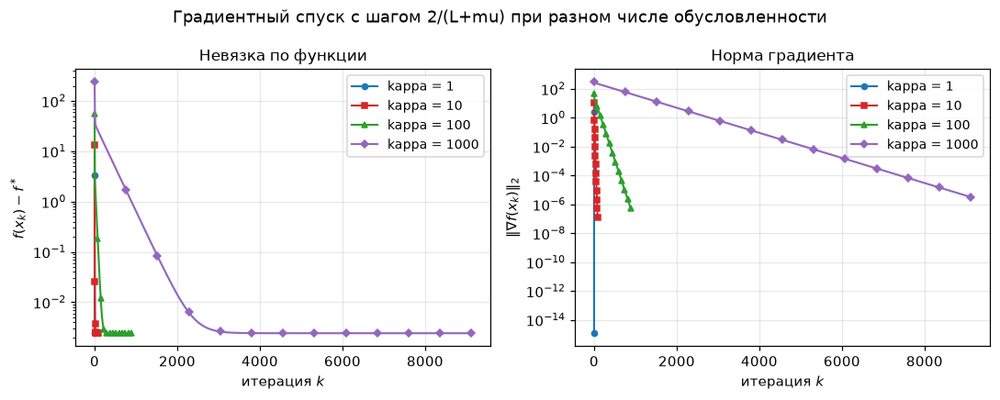

In [10]:
plot_convergence(
    hist_kappa,
    f_star=0.0,
    suptitle="Градиентный спуск с шагом 2/(L+mu) при разном числе обусловленности",
)

Итерации растут почти линейно по $\kappa$: рост $\kappa$ в 10 раз даёт примерно десятикратный рост числа шагов, ровно как обещает оценка $k = O(\kappa\log\frac{1}{\varepsilon})$.
Число объектов $n$ при этом не менялось вообще — стоимость обучения задаёт форма ландшафта, а не размер выборки.
На правом графике видно, что прямые в логарифмической шкале — это линейная сходимость, у которой $\kappa$ управляет только наклоном.


### 5.2. Выбросы: MSE против MAE и Huber

Портим 5% ответов большими выбросами и смотрим, какая функция потерь удерживает прямую.
MAE негладкая, поэтому её минимизируем производным-свободным `Nelder-Mead`; для Huber хватает `BFGS`.


In [11]:
def make_outlier_data(
    n: int, rng: np.random.Generator, frac: float = 0.05, noise: float = 0.3
) -> tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """Одномерная регрессия со свободным членом и долей frac грубых выбросов в y."""
    x = np.linspace(-3.0, 3.0, n)
    X = np.column_stack([np.ones(n), x])
    w_true = np.array([1.0, 2.0])
    y = X @ w_true + noise * rng.standard_normal(n)
    idx = rng.choice(n, size=max(1, int(frac * n)), replace=False)
    y[idx] += rng.choice([-1.0, 1.0], size=idx.size) * rng.uniform(
        12.0, 18.0, size=idx.size
    )
    return X, y, w_true, idx


X_out, y_out, w_true_out, out_idx = make_outlier_data(120, np.random.default_rng(SEED))
w_ls_start = np.linalg.lstsq(X_out, y_out, rcond=None)[0]

fits = {}
f_mse_o, g_mse_o = make_objective(X_out, y_out, loss="mse")
fits["MSE"], _ = scipy_minimize(
    f_mse_o, g_mse_o, np.zeros(2), method="BFGS", gtol=1e-12
)

f_mae_o, g_mae_o = make_objective(X_out, y_out, loss="mae")
fits["MAE"], _ = scipy_minimize(
    f_mae_o,
    g_mae_o,
    w_ls_start,
    method="Nelder-Mead",
    xatol=1e-10,
    fatol=1e-12,
    maxiter=20000,
)

f_hub_o, g_hub_o = make_objective(X_out, y_out, loss="huber", delta=1.0)
fits["Huber"], _ = scipy_minimize(
    f_hub_o, g_hub_o, np.zeros(2), method="BFGS", gtol=1e-12
)

df_out = pd.DataFrame(
    [
        {
            "потери": name,
            "w0 (свободный член)": w[0],
            "w1 (наклон)": w[1],
            "||w - w_true||": float(np.linalg.norm(w - w_true_out)),
        }
        for name, w in fits.items()
    ]
)
df_out

,потери,w0 (свободный член),w1 (наклон),||w - w_true||
0,MSE,0.966855,1.701487,0.300348
1,MAE,0.994715,1.964249,0.036139
2,Huber,0.990250,1.959156,0.041992


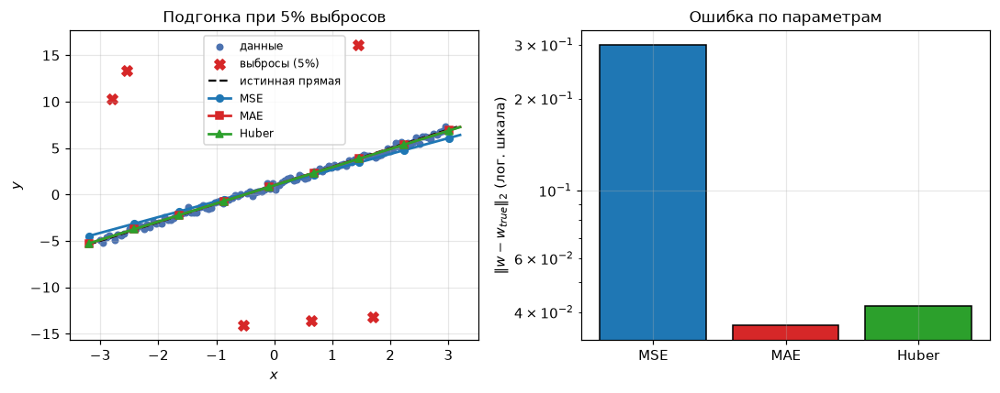

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
mask = np.zeros(len(y_out), dtype=bool)
mask[out_idx] = True
grid = np.linspace(-3.2, 3.2, 100)
G = np.column_stack([np.ones_like(grid), grid])

axes[0].scatter(X_out[~mask, 1], y_out[~mask], s=18, color="#4c72b0", label="данные")
axes[0].scatter(
    X_out[mask, 1], y_out[mask], s=55, color="#d62728", marker="X", label="выбросы (5%)"
)
axes[0].plot(grid, G @ w_true_out, color="k", ls="--", lw=1.5, label="истинная прямая")
for i, (name, w) in enumerate(fits.items()):
    axes[0].plot(
        grid,
        G @ w,
        color=PALETTE[i],
        marker=MARKERS[i],
        markevery=12,
        ms=5,
        lw=1.8,
        label=name,
    )
axes[0].set_xlabel("$x$")
axes[0].set_ylabel("$y$")
axes[0].set_title("Подгонка при 5% выбросов")
axes[0].legend(fontsize=8)

names = list(fits)
errors = [np.linalg.norm(fits[k] - w_true_out) for k in names]
axes[1].bar(names, errors, color=PALETTE[: len(names)], edgecolor="k")
axes[1].set_yscale("log")
axes[1].set_ylabel(r"$\|w - w_{true}\|_2$ (лог. шкала)")
axes[1].set_title("Ошибка по параметрам")
fig.tight_layout()
plt.show()

Шесть испорченных точек из 120 утаскивают MSE-прямую заметно в сторону: квадрат штрафа делает выброс в 15 единиц в сотни раз важнее обычной точки.
MAE и Huber почти совпадают с истинной прямой, и ошибка по параметрам у них на порядок меньше.
Плата за устойчивость — оптимизация: MAE негладкая и градиентные методы на ней буксуют, Huber же остаётся гладким и решается обычным BFGS.


### 5.3. Масштабирование признаков

Признаки с разными масштабами — это тот же ландшафт-овраг, только созданный руками.
`StandardScaler` не меняет задачу по существу, но меняет $\kappa$, а значит и число итераций.


In [13]:
from sklearn.preprocessing import StandardScaler


def scaling_experiment(
    n: int = 400, d: int = 6, tol_rel: float = 1e-8, max_iter: int = 200000
) -> tuple[pd.DataFrame, dict]:
    """Одна и та же задача до и после StandardScaler: kappa и число итераций GD."""
    local_rng = np.random.default_rng(SEED)
    scales = np.logspace(0.0, 1.2, d)
    X_raw = local_rng.standard_normal((n, d)) * scales
    w_true = local_rng.standard_normal(d) / scales
    y_raw = X_raw @ w_true + 0.1 * local_rng.standard_normal(n)

    X_scaled = StandardScaler().fit_transform(X_raw)
    y_centered = y_raw - y_raw.mean()

    rows, histories = [], {}
    for name, (X, y) in {
        "без масштабирования": (X_raw, y_raw),
        "StandardScaler": (X_scaled, y_centered),
    }.items():
        f, grad = make_objective(X, y, loss="mse")
        eigs = np.linalg.eigvalsh(mse_hessian(X))
        L, mu = float(eigs.max()), float(eigs.min())
        x0 = np.zeros(d)
        tol = tol_rel * float(np.linalg.norm(grad(x0)))
        _, hist = gradient_descent(
            f, grad, x0, lr=2.0 / (L + mu), n_iter=max_iter, tol=tol
        )
        rows.append(
            {
                "данные": name,
                "kappa": L / mu,
                "L": L,
                "mu": mu,
                "итераций": hist["n_iter"],
                "время, с": hist["time"][-1],
                "сошёлся": hist["converged"],
            }
        )
        histories[name] = hist
    return pd.DataFrame(rows), histories


df_scale, hist_scale = scaling_experiment()
df_scale

,данные,kappa,L,mu,итераций,"время, с",сошёлся
0,без масштабирования,239.869637,504.839639,2.104642,2204,0.031533,True
1,StandardScaler,1.389930,2.330258,1.676529,10,0.000155,True


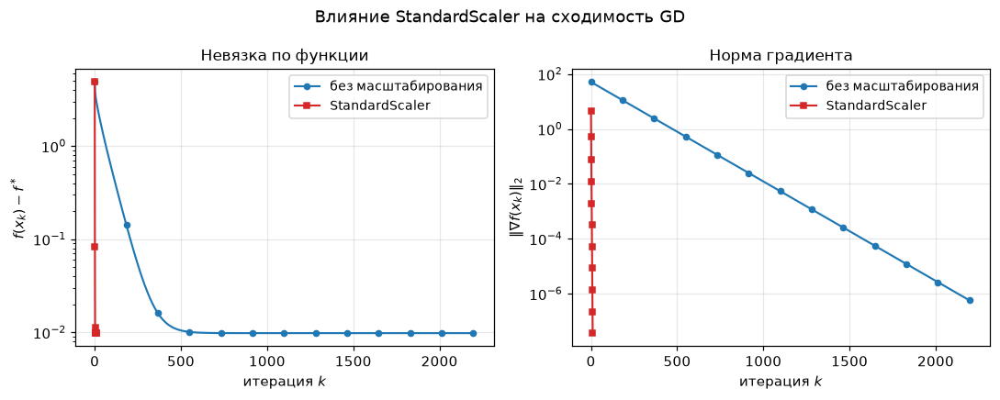

In [14]:
plot_convergence(
    hist_scale, f_star=0.0, suptitle="Влияние StandardScaler на сходимость GD"
)

Масштабирование не поменяло ни модель, ни данные по существу — оно поменяло единицы измерения признаков и вместе с ними число обусловленности на несколько порядков.
Число итераций падает пропорционально $\kappa$: это самая дешёвая оптимизационная оптимизация, которая существует.
Отсюда практическое правило: перед любым итеративным методом (GD, SGD, логистическая регрессия, нейросеть) признаки надо приводить к сопоставимому масштабу.


### 5.4. Сравнение методов `scipy`: 4 метода $\times$ 4 значения $\kappa$

Считаем не время (оно зависит от машины), а **число вызовов функции** `nfev` — честную меру работы,
и итоговую ошибку по параметрам. `BFGS` и `CG` получают аналитический градиент, `Nelder-Mead` и `Powell` работают без него.


In [15]:
SCIPY_OPTIONS = {
    "BFGS": dict(gtol=1e-8, maxiter=5000),
    "CG": dict(gtol=1e-8, maxiter=5000),
    "Nelder-Mead": dict(xatol=1e-8, fatol=1e-12, maxiter=20000, maxfev=20000),
    "Powell": dict(xtol=1e-8, ftol=1e-12, maxiter=20000, maxfev=20000),
}
METHODS = list(SCIPY_OPTIONS)


def compare_methods(
    kappas: list[float], methods: list[str], n: int = 400, d: int = 20
) -> pd.DataFrame:
    """Развёртка методы x kappa: число вызовов функции, ошибка, время."""
    rows = []
    for kappa in kappas:
        X, y, _ = make_regression_data(
            n, d, np.random.default_rng(SEED), kappa=kappa, noise=0.05
        )
        f, grad = make_objective(X, y, loss="mse")
        w_star = np.linalg.lstsq(X, y, rcond=None)[0]
        f_star = f(w_star)
        x0 = np.ones(d)
        for method in methods:
            t0 = time.perf_counter()
            w, hist = scipy_minimize(
                f, grad, x0, method=method, **SCIPY_OPTIONS[method]
            )
            rows.append(
                {
                    "метод": method,
                    "kappa": kappa,
                    "n_fev": hist["nfev"],
                    "итераций": hist["n_iter"],
                    "время, с": time.perf_counter() - t0,
                    "f - f*": max(float(f(w)) - f_star, 0.0),
                    "||w - w*||": float(np.linalg.norm(w - w_star)),
                    "сошёлся": hist["converged"],
                }
            )
    return pd.DataFrame(rows)


df_methods = compare_methods(KAPPAS, METHODS)
df_methods.pivot(index="метод", columns="kappa", values="n_fev")

kappa,1.0,10.0,100.0,1000.0
метод,,,,
BFGS,4,39,35,35
CG,3,39,185,650
Nelder-Mead,20000,20000,20000,20000
Powell,579,7715,12992,19950


In [16]:
df_view = df_methods.sort_values(["kappa", "метод"]).reset_index(drop=True).copy()
df_view["время, с"] = df_view["время, с"].round(4)
df_view["f - f*"] = df_view["f - f*"].map("{:.2e}".format)
df_view["||w - w*||"] = df_view["||w - w*||"].map("{:.2e}".format)
df_view

,метод,kappa,n_fev,итераций,"время, с",f - f*,||w - w*||,сошёлся
0,BFGS,1.0,4,3,0.0004,0.00e+00,2.29e-15,True
1,CG,1.0,3,1,0.0002,0.00e+00,3.39e-14,True
2,Nelder-Mead,1.0,20000,16014,0.5131,5.08e-02,3.19e-01,False
3,Powell,1.0,579,2,0.0046,0.00e+00,1.41e-09,True
4,BFGS,10.0,39,24,0.0020,1.95e-17,4.65e-09,True
5,CG,10.0,39,19,0.0015,1.64e-16,1.71e-08,True
6,Nelder-Mead,10.0,20000,15962,0.4949,7.49e-02,2.69e-01,False
7,Powell,10.0,7715,27,0.0552,4.81e-16,2.33e-08,True
8,BFGS,100.0,35,25,0.0019,1.73e-18,5.22e-09,True
9,CG,100.0,185,113,0.0074,4.08e-17,7.55e-09,True


В размерности $d = 20$ картина расходится веером. `BFGS` почти не чувствует $\kappa$: он накапливает приближение обратного гессиана, то есть по ходу дела сам исправляет геометрию, и укладывается в несколько десятков вызовов.
`CG` градиент использует, но кривизну не запоминает, поэтому его цена растёт вместе с $\kappa$ на порядок с лишним. `Powell` до решения доходит, но платит за это в сотни раз больше вычислений функции, а `Nelder-Mead` в такой размерности упирается в лимит 20000 вызовов и возвращает решение с ошибкой порядка единиц.
Вывод для практики: если градиент можно посчитать — его надо считать, а производные-свободные методы держать для негладких или «чёрных» задач малой размерности.


## 6. Визуализация

### 6.1. Ландшафты четырёх функций потерь

Двумерная задача ($d = 2$), чтобы всё было видно: линии уровня и 3D-поверхность для MSE, MAE, Huber и logloss.


In [17]:
rng_land = np.random.default_rng(SEED)
X_2d, y_2d, w_true_2d = make_regression_data(200, 2, rng_land, kappa=8.0, noise=0.5)
y_2d_bin = (y_2d > np.median(y_2d)).astype(float)

objectives_2d = {
    "MSE": make_objective(X_2d, y_2d, loss="mse"),
    "MAE": make_objective(X_2d, y_2d, loss="mae"),
    "Huber (delta=1)": make_objective(X_2d, y_2d, loss="huber", delta=1.0),
    "logloss + L2": make_objective(X_2d, y_2d_bin, loss="logloss", l2=0.02),
}

w_star_2d = np.linalg.lstsq(X_2d, y_2d, rcond=None)[0]
center = w_star_2d
span = 2.5
xlim = (center[0] - span, center[0] + span)
ylim = (center[1] - span, center[1] + span)

surfaces = {
    name: loss_surface(f, xlim, ylim, n_grid=90)
    for name, (f, _) in objectives_2d.items()
}
print("сетки посчитаны:", list(surfaces))

сетки посчитаны: ['MSE', 'MAE', 'Huber (delta=1)', 'logloss + L2']


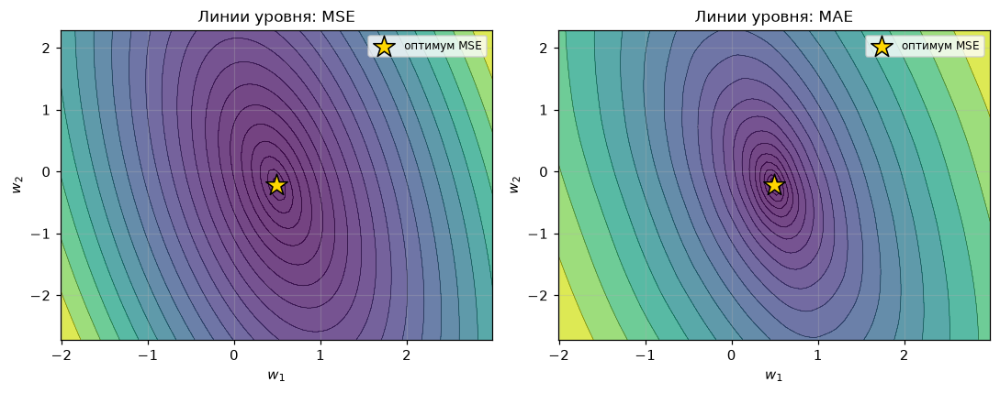

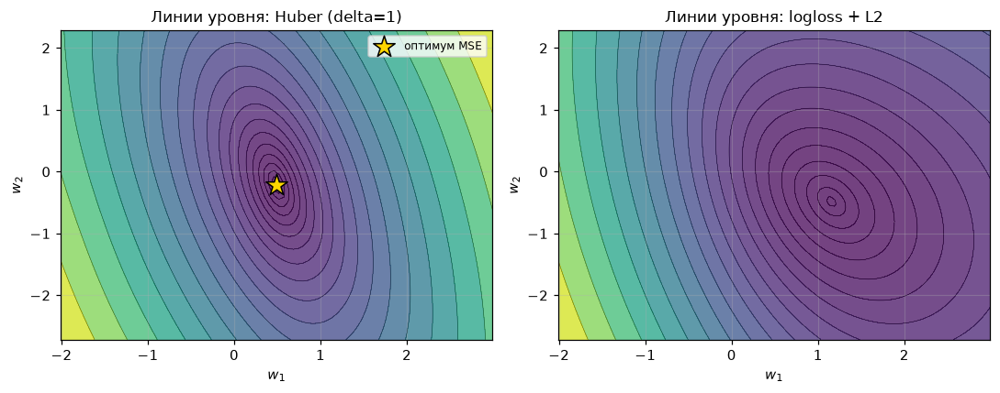

In [18]:
for pair in (["MSE", "MAE"], ["Huber (delta=1)", "logloss + L2"]):
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    for ax, name in zip(axes, pair):
        XX, YY, ZZ = surfaces[name]
        draw_contours(ax, XX, YY, ZZ)
        if name != "logloss + L2":
            mark_optimum(ax, w_star_2d, label="оптимум MSE")
            ax.legend(loc="upper right", fontsize=8)
        ax.set_title(f"Линии уровня: {name}")
    fig.tight_layout()
    plt.show()

Все четыре ландшафта выпуклы: линии уровня замкнуты и вложены друг в друга, локальных минимумов нет — это то, что делает линейные модели приятным объектом для оптимизации.
Форму эллипсов задаёт матрица $X$, а не функция потерь: у MSE и MAE вытянутость одинаковая, различается только то, как быстро растут уровни при удалении от минимума.
У logloss минимум смещён в другое место — это уже другая задача (классификация), и конечным решение здесь удерживает именно L2-штраф.


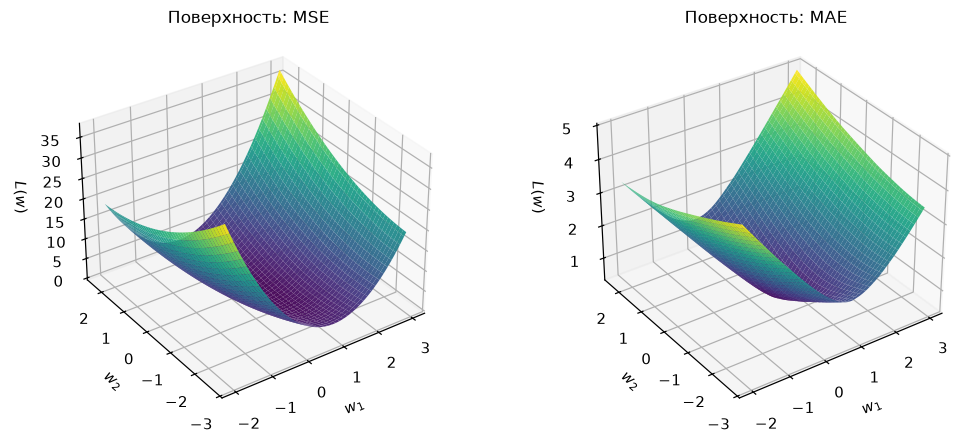

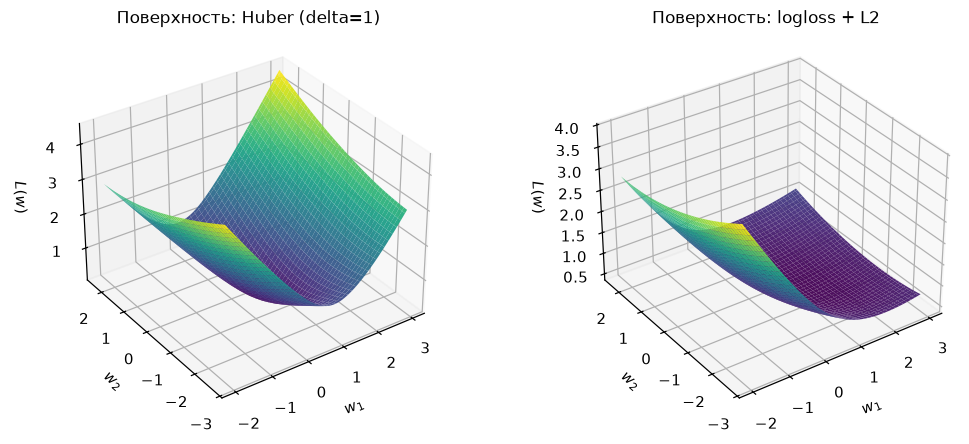

In [19]:
for pair in (["MSE", "MAE"], ["Huber (delta=1)", "logloss + L2"]):
    fig = plt.figure(figsize=(10, 4))
    for i, name in enumerate(pair, start=1):
        XX, YY, ZZ = surfaces[name]
        ax = fig.add_subplot(1, 2, i, projection="3d")
        ax.plot_surface(
            XX, YY, ZZ, cmap="viridis", linewidth=0, antialiased=True, alpha=0.95
        )
        ax.set_xlabel("$w_1$")
        ax.set_ylabel("$w_2$")
        ax.set_zlabel("$L(w)$")
        ax.set_title(f"Поверхность: {name}")
        ax.view_init(elev=32, azim=-125)
    fig.tight_layout()
    plt.show()

У MSE поверхность — гладкая параболическая чаша; MAE даёт похожую по форме чашу, но растущую линейно, а не квадратично, поэтому её стенки заметно положе.
Изломы MAE на этой картинке не разглядеть: каждый объект добавляет свой излом, и по 200 объектам они усредняются в почти гладкую поверхность — негладкость приходится ловить не глазами, а на срезе производной (следующая ячейка).
Ландшафт logloss с L2 тоже выпуклый и гладкий, но растёт заметно медленнее: далеко от минимума градиент почти не убывает, поэтому чистая логистическая регрессия без регуляризации может уходить в бесконечность на линейно разделимых данных.


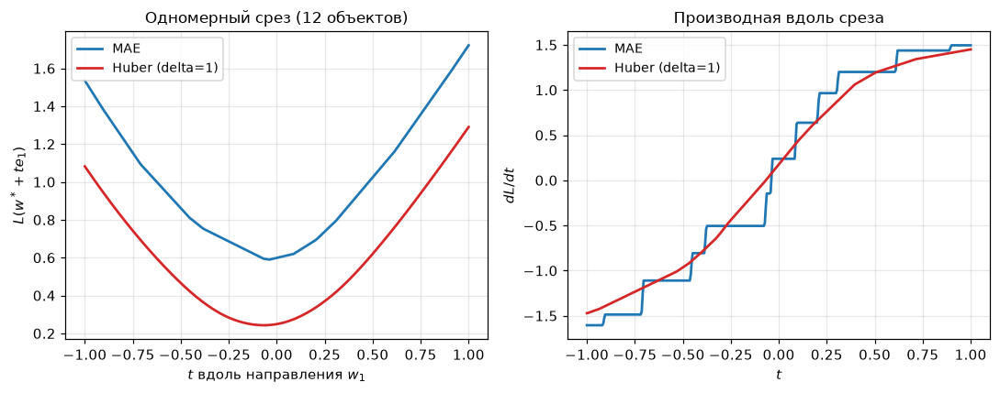

In [20]:
# на 12 объектах изломы не успевают усредниться и видны в чистом виде
X_slice, y_slice = X_2d[:12], y_2d[:12]
slice_objectives = {
    "MAE": make_objective(X_slice, y_slice, loss="mae")[0],
    "Huber (delta=1)": make_objective(X_slice, y_slice, loss="huber", delta=1.0)[0],
}
direction = np.array([1.0, 0.0])
t_grid = np.linspace(-1.0, 1.0, 400)
slice_center = w_star_2d + np.array([0.0, 0.3])

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
for i, name in enumerate(["MAE", "Huber (delta=1)"]):
    f_loss = slice_objectives[name]
    vals = np.array([f_loss(slice_center + t * direction) for t in t_grid])
    deriv = np.gradient(vals, t_grid)
    axes[0].plot(t_grid, vals, color=PALETTE[i], lw=1.8, label=name)
    axes[1].plot(t_grid, deriv, color=PALETTE[i], lw=1.8, label=name)
axes[0].set_xlabel("$t$ вдоль направления $w_1$")
axes[0].set_ylabel("$L(w^* + t e_1)$")
axes[0].set_title("Одномерный срез (12 объектов)")
axes[1].set_xlabel("$t$")
axes[1].set_ylabel("$dL/dt$")
axes[1].set_title("Производная вдоль среза")
for ax in axes:
    ax.legend()
fig.tight_layout()
plt.show()

Слева обе кривые выглядят почти одинаково: у MAE видны лёгкие переломы, но по значению функции их легко пропустить.
Справа разница очевидна: производная MAE — лестница из 12 ступенек (по одной на каждый объект, в момент смены знака его остатка), а у Huber она непрерывна.
Именно из-за этих разрывов методы, предполагающие гладкость (BFGS, CG), на MAE ведут себя непредсказуемо, а Huber решается ими без проблем.


### 6.2. Траектории градиентного спуска на разных $\kappa$

Один метод, один шаг-правило $\eta = 2/(L+\mu)$, четыре ландшафта.


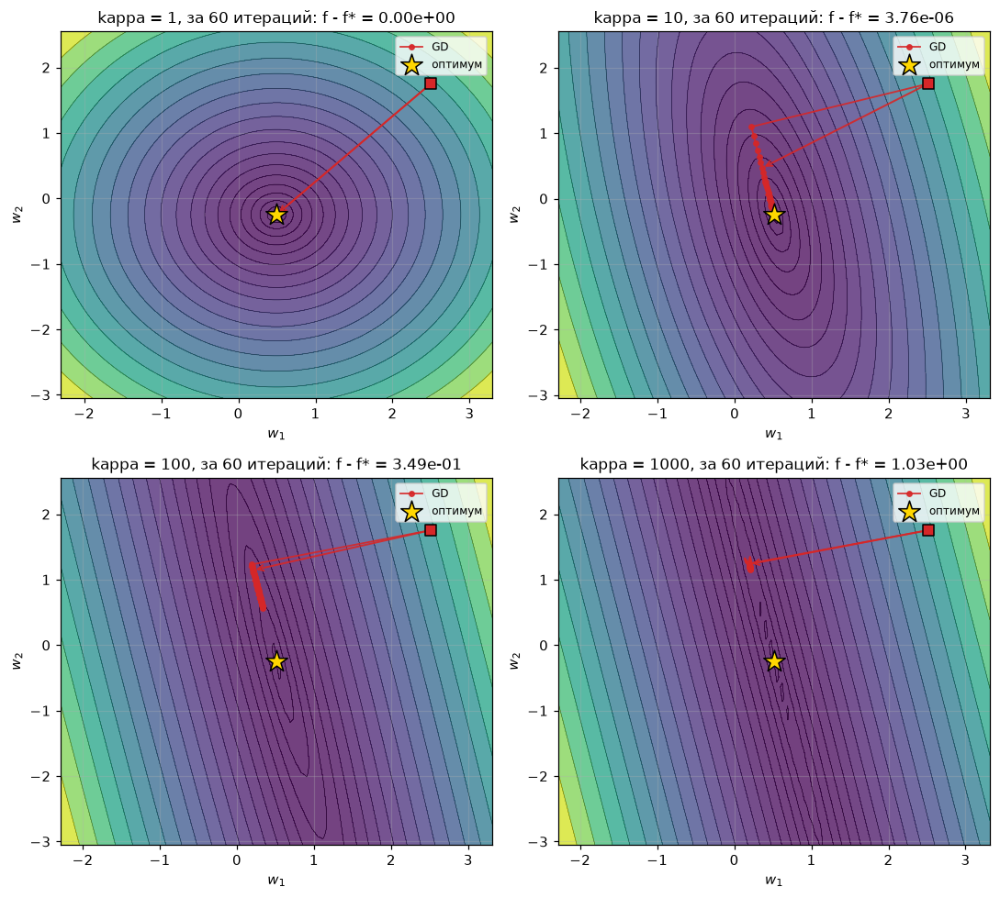

In [21]:
fig, axes = plt.subplots(2, 2, figsize=(10, 9))
traj_hist = {}
for ax, kappa in zip(axes.ravel(), KAPPAS):
    X_t, y_t, _ = make_regression_data(
        200, 2, np.random.default_rng(SEED), kappa=kappa, noise=0.2
    )
    f_t, g_t = make_objective(X_t, y_t, loss="mse")
    w_star_t = np.linalg.lstsq(X_t, y_t, rcond=None)[0]
    eigs_t = np.linalg.eigvalsh(mse_hessian(X_t))
    L_t, mu_t = float(eigs_t.max()), float(eigs_t.min())
    x0_t = w_star_t + np.array([2.0, 2.0])
    # шаг 1/L: «жёсткое» направление гасится за один шаг, дальше видно движение по дну оврага
    _, hist_t = gradient_descent(f_t, g_t, x0_t, lr=1.0 / L_t, n_iter=60, tol=1e-12)
    traj_hist[f"kappa = {kappa:g}"] = hist_t

    lim = 2.8
    XX_t, YY_t, ZZ_t = loss_surface(
        f_t,
        (w_star_t[0] - lim, w_star_t[0] + lim),
        (w_star_t[1] - lim, w_star_t[1] + lim),
        n_grid=80,
    )
    draw_contours(ax, XX_t, YY_t, ZZ_t)
    draw_trajectory(ax, hist_t["x"], label="GD", color="#d62728", marker="o")
    mark_optimum(ax, w_star_t)
    ax.set_title(
        f"kappa = {kappa:g}, за 60 итераций: f - f* = {hist_t['f'][-1] - f_t(w_star_t):.2e}"
    )
    ax.legend(loc="upper right", fontsize=8)
fig.tight_layout()
plt.show()

При $\kappa = 1$ линии уровня — окружности, антиградиент смотрит прямо в минимум, и метод попадает в оптимум за один шаг.
С ростом $\kappa$ эллипсы вытягиваются в овраг: первый же шаг сбрасывает точку на дно (шаг $1/L$ гасит самое «жёсткое» направление полностью), а дальше метод медленно ползёт вдоль дна, и длина этого ползания растёт вместе с $\kappa$ — при $\kappa = 1000$ за 60 итераций до звёздочки остаётся ещё далеко.
Это та же таблица из 5.1, только нарисованная. Если увеличить шаг ближе к $2/L$, добавится зигзаг между стенками оврага — границу устойчивости мы измерим в задаче 3.


### 6.3. Анимация спуска и её статическая версия

Анимация — для показа на семинаре; сетка кадров рядом — чтобы ноутбук читался, даже если JS не отрендерился.


In [22]:
X_a, y_a, _ = make_regression_data(
    200, 2, np.random.default_rng(SEED), kappa=40.0, noise=0.2
)
f_a, g_a = make_objective(X_a, y_a, loss="mse")
w_star_a = np.linalg.lstsq(X_a, y_a, rcond=None)[0]
eigs_a = np.linalg.eigvalsh(mse_hessian(X_a))
lr_a = 1.0 / float(eigs_a.max())
_, hist_a = gradient_descent(
    f_a, g_a, w_star_a + np.array([2.2, 2.2]), lr=lr_a, n_iter=60, tol=1e-12
)
xs_a = hist_a["x"]

lim_a = 3.0
XX_a, YY_a, ZZ_a = loss_surface(
    f_a,
    (w_star_a[0] - lim_a, w_star_a[0] + lim_a),
    (w_star_a[1] - lim_a, w_star_a[1] + lim_a),
    n_grid=90,
)


def animate_descent(xs: np.ndarray, n_frames: int = 40) -> animation.FuncAnimation:
    """Анимация траектории поверх линий уровня."""
    fig_an, ax_an = plt.subplots(figsize=(7, 6))
    draw_contours(ax_an, XX_a, YY_a, ZZ_a)
    mark_optimum(ax_an, w_star_a)
    (line,) = ax_an.plot([], [], marker="o", ms=4, lw=1.5, color="#d62728", label="GD")
    ax_an.set_title("Градиентный спуск, kappa = 40")
    ax_an.legend(loc="upper right", fontsize=8)
    frames = np.linspace(1, len(xs), n_frames).astype(int)

    def update(i: int):
        pts = xs[: frames[i]]
        line.set_data(pts[:, 0], pts[:, 1])
        return (line,)

    anim_obj = animation.FuncAnimation(
        fig_an, update, frames=n_frames, interval=120, blit=True
    )
    plt.close(fig_an)
    return anim_obj


anim = animate_descent(xs_a)
HTML(anim.to_jshtml())

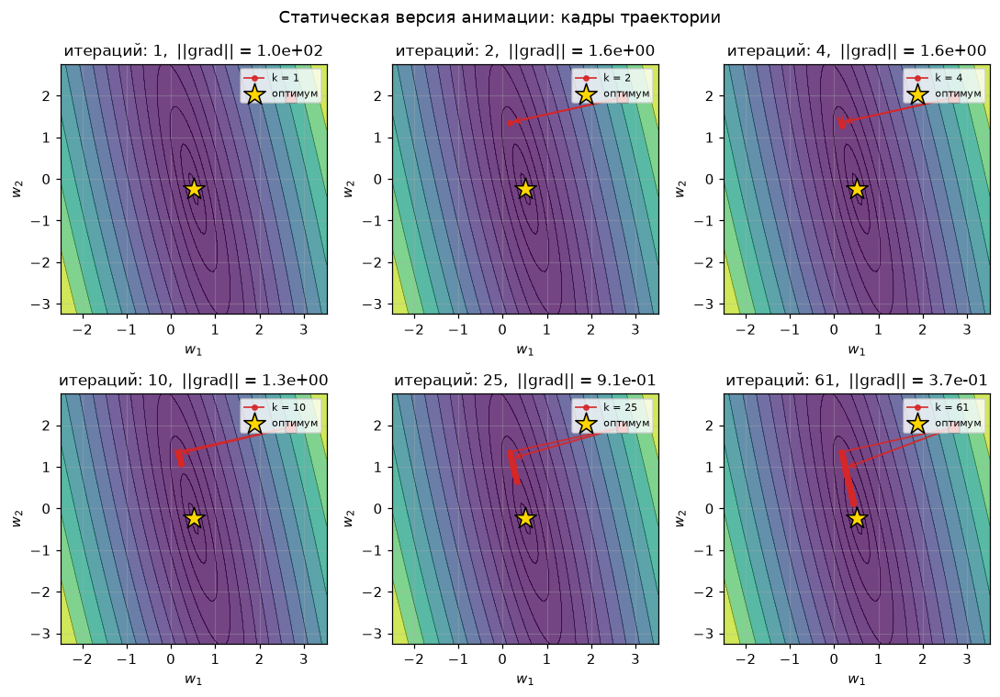

In [23]:
checkpoints = [1, 2, 4, 10, 25, len(xs_a)]
fig, axes = plt.subplots(2, 3, figsize=(10, 7))
for ax, k in zip(axes.ravel(), checkpoints):
    draw_contours(ax, XX_a, YY_a, ZZ_a, n_levels=16)
    draw_trajectory(
        ax, xs_a[:k], label=f"k = {k}", color="#d62728", marker="o", n_arrows=5
    )
    mark_optimum(ax, w_star_a)
    ax.set_title(f"итераций: {k},  ||grad|| = {hist_a['grad_norm'][k - 1]:.1e}")
    ax.legend(loc="upper right", fontsize=7)
fig.suptitle("Статическая версия анимации: кадры траектории")
fig.tight_layout()
plt.show()

Первый шаг длинный и сразу сбрасывает траекторию на дно оврага: направление с максимальной кривизной при шаге $1/L$ гасится за одну итерацию.
Дальше метод медленно ползёт вдоль дна, и норма градиента падает на порядки медленнее, чем на первом шаге.
Отсюда идея всех ускорений (momentum, сопряжённые градиенты, ньютоновские методы): не бороться с оврагом шагом, а исправить геометрию.


### 6.4. Heatmap: методы $\times$ $\kappa$


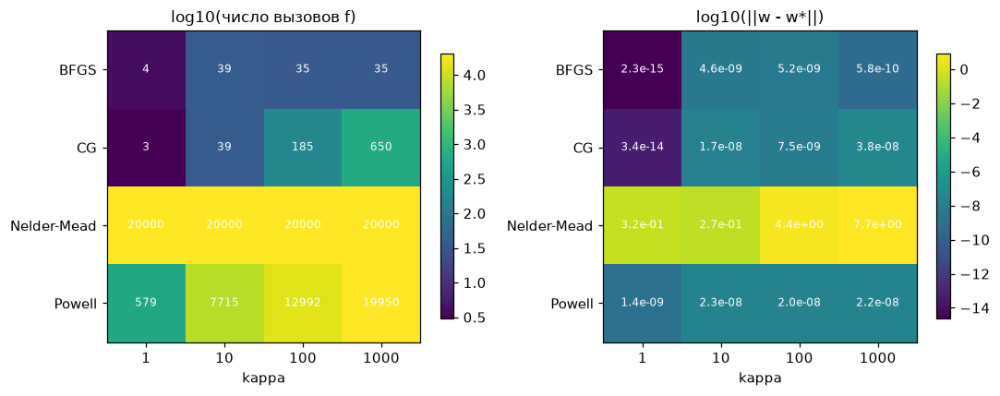

In [24]:
pivot_fev = df_methods.pivot(index="метод", columns="kappa", values="n_fev")
pivot_err = df_methods.pivot(index="метод", columns="kappa", values="||w - w*||")

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
panels = [
    (axes[0], pivot_fev, "log10(число вызовов f)", "{:.0f}"),
    (axes[1], pivot_err, "log10(||w - w*||)", "{:.1e}"),
]
for ax, table, title, fmt in panels:
    data = np.log10(np.maximum(table.to_numpy(dtype=float), 1e-16))
    im = ax.imshow(data, cmap="viridis", aspect="auto")
    ax.set_xticks(range(table.shape[1]), [f"{c:g}" for c in table.columns])
    ax.set_yticks(range(table.shape[0]), list(table.index))
    ax.set_xlabel("kappa")
    ax.set_title(title)
    ax.grid(False)
    for i in range(table.shape[0]):
        for j in range(table.shape[1]):
            ax.text(
                j,
                i,
                fmt.format(table.to_numpy()[i, j]),
                ha="center",
                va="center",
                color="w",
                fontsize=8,
            )
    fig.colorbar(im, ax=ax, shrink=0.85)
fig.tight_layout()
plt.show()

Левая панель: разница в числе вызовов функции между `BFGS` и `Nelder-Mead` доходит до трёх порядков на одной и той же задаче.
Правая панель: и это не «медленнее, но точнее» — у `Nelder-Mead` ошибка по параметрам на 8 и более порядков хуже, то есть 20000 вызовов потрачены, а решение не получено.
Один и тот же ландшафт для разных методов стоит принципиально разного количества работы; выбор метода — такое же проектное решение, как выбор модели.


## 7. Как это ломается: почти коллинеарные признаки

Возьмём честные данные и добавим два признака, которые почти линейно выражаются через остальные (шум $10^{-8}$).
Это ровно то, что бывает в реальности: цена в рублях и цена в тысячах рублей, дублирующиеся one-hot колонки, сумма компонент рядом с самими компонентами.


In [25]:
def make_collinear_data(
    n: int, rng: np.random.Generator, eps: float = 1e-8
) -> tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """Train и test одинаковой структуры: 4 независимых признака + 2 почти зависимых от них."""

    def design(m: int) -> np.ndarray:
        B = rng.standard_normal((m, 4))
        return np.column_stack(
            [
                B,
                B[:, 0] + eps * rng.standard_normal(m),
                B[:, 1] - 2.0 * B[:, 2] + eps * rng.standard_normal(m),
            ]
        )

    w_true = rng.standard_normal(6)
    X_tr, X_te = design(n), design(n)
    y_tr = X_tr @ w_true + 0.01 * rng.standard_normal(n)
    y_te = X_te @ w_true + 0.01 * rng.standard_normal(n)
    return X_tr, y_tr, X_te, y_te, w_true


def solve_variants(X: np.ndarray, y: np.ndarray, alpha: float) -> dict[str, np.ndarray]:
    """Четыре способа решить одну и ту же задачу МНК."""
    d = X.shape[1]
    G_local = X.T @ X
    out: dict[str, np.ndarray] = {}
    try:
        out["solve(X^T X, X^T y)"] = np.linalg.solve(G_local, X.T @ y)
    except np.linalg.LinAlgError:
        out["solve(X^T X, X^T y)"] = np.full(d, np.nan)
    out["lstsq, rcond=None"] = np.linalg.lstsq(X, y, rcond=None)[0]
    out["lstsq, rcond=1e-6"] = np.linalg.lstsq(X, y, rcond=1e-6)[0]
    out["ridge (alpha мал.)"] = np.linalg.solve(G_local + alpha * np.eye(d), X.T @ y)
    return out


X_col, y_col, X_col_te, y_col_te, w_true_col = make_collinear_data(
    500, np.random.default_rng(SEED)
)
G = X_col.T @ X_col
alpha_small = 1e-8 * np.trace(G) / X_col.shape[1]

print(f"cond(X)                = {np.linalg.cond(X_col):.3e}")
print(f"cond(X^T X)            = {np.linalg.cond(G):.3e}   (= cond(X)^2)")
print(f"cond(X^T X + alpha I)  = {np.linalg.cond(G + alpha_small * np.eye(6)):.3e}")
print(f"1 / eps_float64        = {1.0 / np.finfo(float).eps:.3e}")
print(
    "\nсингулярные числа X:",
    np.array2string(np.linalg.svd(X_col, compute_uv=False), precision=3),
)

cond(X)                = 5.630e+08
cond(X^T X)            = 1.619e+17   (= cond(X)^2)
cond(X^T X + alpha I)  = 3.407e+08
1 / eps_float64        = 4.504e+15

сингулярные числа X: [5.226e+01 3.263e+01 2.338e+01 2.162e+01 1.606e-07 9.282e-08]


In [26]:
sols_col = solve_variants(X_col, y_col, alpha_small)
rss_best = min(float(np.sum((X_col @ w - y_col) ** 2)) for w in sols_col.values())

pd.DataFrame(
    [
        {
            "способ": name,
            "RSS (train)": float(np.sum((X_col @ w - y_col) ** 2)),
            "RSS / RSS_min - 1": float(np.sum((X_col @ w - y_col) ** 2)) / rss_best
            - 1.0,
            "||w||": float(np.linalg.norm(w)),
            "MSE (test)": float(np.mean((X_col_te @ w - y_col_te) ** 2)),
        }
        for name, w in sols_col.items()
    ]
)

,способ,RSS (train),RSS / RSS_min - 1,||w||,MSE (test)
0,"solve(X^T X, X^T y)",5.071001,93.933670,1.385540e+07,0.009629
1,"lstsq, rcond=None",0.053416,0.000000,9.270520e+04,0.000102
2,"lstsq, rcond=1e-6",0.053638,0.004146,2.307389e+00,0.000102
3,ridge (alpha мал.),0.053638,0.004146,2.307389e+00,0.000102


Формально не упало ничего: все четыре способа вернули числа, и даже ошибка на тесте у них почти одинаковая — предсказания выживают, потому что в тестовых данных та же коллинеарность и огромные коэффициенты взаимно сокращаются.
Ломается другое: нормы решений различаются на четыре-пять порядков ($\|w\|\sim 10^{4}$–$10^{5}$ против $\approx 2.3$ у усечённого SVD и ridge), то есть коэффициенты бессмысленны и интерпретировать их нельзя.
При этом `solve` даёт ещё и RSS хуже минимальной: он решает ту же задачу, но в арифметике `float64` уже не попадает в её минимум.


In [27]:
def sensitivity(
    X: np.ndarray,
    y: np.ndarray,
    alpha: float,
    n_trials: int = 20,
    noise: float = 1e-6,
    seed: int = SEED,
) -> pd.DataFrame:
    """Насколько сдвигается решение, если добавить к y шум амплитуды noise."""
    base = solve_variants(X, y, alpha)
    local_rng = np.random.default_rng(seed)
    shifts: dict[str, list[float]] = {name: [] for name in base}
    for _ in range(n_trials):
        y_pert = y + noise * local_rng.standard_normal(y.size)
        perturbed = solve_variants(X, y_pert, alpha)
        for name in base:
            shifts[name].append(float(np.linalg.norm(perturbed[name] - base[name])))
    return pd.DataFrame(
        [
            {
                "способ": name,
                "медианный сдвиг ||dw||": float(np.median(shifts[name])),
                "во сколько раз больше шума": float(np.median(shifts[name])) / noise,
            }
            for name in base
        ]
    )


sensitivity(X_col, y_col, alpha_small)

,способ,медианный сдвиг ||dw||,во сколько раз больше шума
0,"solve(X^T X, X^T y)",3.583385e+03,3.583385e+09
1,"lstsq, rcond=None",1.187162e+01,1.187162e+07
2,"lstsq, rcond=1e-6",6.063641e-08,6.063641e-02
3,ridge (alpha мал.),1.804825e-07,1.804825e-01


Вот численное доказательство неустойчивости: шум амплитуды $10^{-6}$ в $y$ сдвигает решение нормального уравнения и полного `lstsq` на единицы — в миллионы раз сильнее самого возмущения.
Усечённый SVD и ridge на том же шуме шевелятся на $10^{-7}$, то есть ведут себя так, как мы интуитивно ожидаем от решения.
Это и есть практический смысл числа обусловленности: оно показывает, во сколько раз задача усиливает любую ошибку — в данных, в округлении, в предыдущей итерации метода.


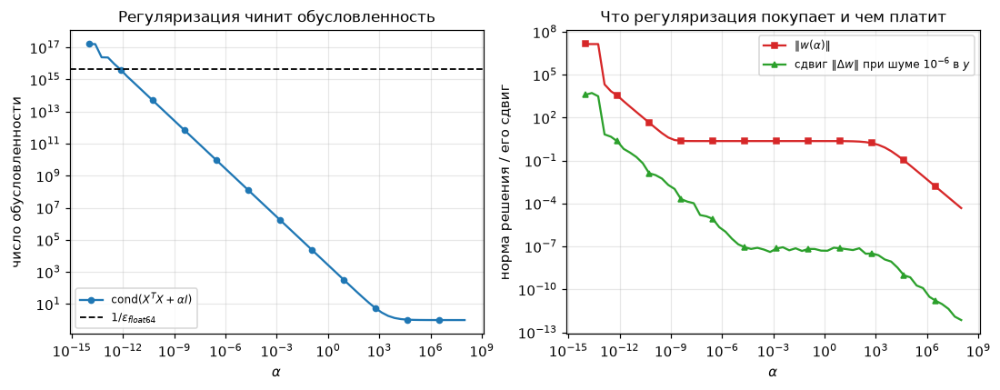

In [28]:
def ridge_path_stats(
    X: np.ndarray,
    y: np.ndarray,
    alphas: np.ndarray,
    n_trials: int = 5,
    noise: float = 1e-6,
    seed: int = SEED,
) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Для каждого alpha: обусловленность, норма решения и его чувствительность к шуму в y."""
    d = X.shape[1]
    G_local = X.T @ X
    local_rng = np.random.default_rng(seed)
    conds, norms, sens = [], [], []
    for a in alphas:
        A = G_local + a * np.eye(d)
        conds.append(
            min(float(np.linalg.cond(A)), 1e20)
        )  # inf обрезаем, иначе не строится график
        try:
            w0 = np.linalg.solve(A, X.T @ y)
        except np.linalg.LinAlgError:
            norms.append(np.nan)
            sens.append(np.nan)
            continue
        shifts = []
        for _ in range(n_trials):
            y_pert = y + noise * local_rng.standard_normal(y.size)
            try:
                shifts.append(
                    float(np.linalg.norm(np.linalg.solve(A, X.T @ y_pert) - w0))
                )
            except np.linalg.LinAlgError:
                shifts.append(np.nan)
        norms.append(float(np.linalg.norm(w0)))
        sens.append(float(np.nanmedian(shifts)))
    return np.array(conds), np.array(norms), np.array(sens)


alphas_path = np.logspace(-14.0, 8.0, 60)
conds_path, norms_path, sens_path = ridge_path_stats(X_col, y_col, alphas_path)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].loglog(
    alphas_path,
    conds_path,
    color=PALETTE[0],
    marker="o",
    markevery=5,
    ms=4,
    label=r"$\mathrm{cond}(X^TX + \alpha I)$",
)
axes[0].axhline(
    1.0 / np.finfo(float).eps,
    color="k",
    ls="--",
    lw=1.2,
    label=r"$1/\varepsilon_{float64}$",
)
axes[0].set_xlabel(r"$\alpha$")
axes[0].set_ylabel("число обусловленности")
axes[0].set_title("Регуляризация чинит обусловленность")
axes[0].legend(fontsize=8)

axes[1].loglog(
    alphas_path,
    norms_path,
    color=PALETTE[1],
    marker="s",
    markevery=5,
    ms=4,
    label=r"$\|w(\alpha)\|$",
)
axes[1].loglog(
    alphas_path,
    sens_path,
    color=PALETTE[2],
    marker="^",
    markevery=5,
    ms=4,
    label=r"сдвиг $\|\Delta w\|$ при шуме $10^{-6}$ в $y$",
)
axes[1].set_xlabel(r"$\alpha$")
axes[1].set_ylabel("норма решения / его сдвиг")
axes[1].set_title("Что регуляризация покупает и чем платит")
axes[1].legend(fontsize=8)
fig.tight_layout()
plt.show()

Слева: обусловленность падает обратно пропорционально $\alpha$, и примерно с $\alpha \sim 10^{-8}$ задача снова решается устойчиво в `float64`.
Справа: норма решения и его чувствительность к шуму падают синхронно — регуляризация покупает устойчивость, подавляя направления с почти нулевой кривизной.
Плата видна на правом краю: при $\alpha$, сравнимом с $\lambda_{\max}$ и больше, норма решения уходит к нулю — модель сжимается к тривиальной. Поэтому $\alpha$ подбирают по качеству на валидации, а не по красоте числа обусловленности.


## 8. Задачи для самостоятельной работы

Решения — в конце ноутбука, в разделе «Решения». Сначала попробуйте сами.


**Задача 1 (разминка).** Реализуйте градиент Huber-потерь и проверьте его конечными разностями.

Контракт: `huber_loss_grad(w, X, y, delta) -> tuple[float, np.ndarray]` — возвращает значение
$L(w) = \frac1n\sum \ell_\delta(y_i, \langle w, x_i\rangle)$ и её градиент.
Проверка должна давать расхождение меньше $10^{-6}$ и в области $|r| < \delta$, и в области $|r| > \delta$.


In [29]:
def huber_loss_grad(
    w: np.ndarray, X: np.ndarray, y: np.ndarray, delta: float = 1.0
) -> tuple[float, np.ndarray]:
    """Значение и градиент Huber-потерь. TODO: реализовать."""
    # TODO: r = X @ w - y
    # TODO: значение — np.where(|r| <= delta, 0.5 r^2, delta(|r| - 0.5 delta)), усреднить
    # TODO: градиент — X^T clip(r, -delta, delta) / n
    raise NotImplementedError


# проверка (должна отработать без ошибок после реализации)
# X_t1, y_t1, _ = make_regression_data(150, 3, np.random.default_rng(0), kappa=5.0, noise=2.0)
# w_t1 = np.random.default_rng(0).standard_normal(3)
# err = check_gradient(lambda w: huber_loss_grad(w, X_t1, y_t1, 1.0)[0],
#                      lambda w: huber_loss_grad(w, X_t1, y_t1, 1.0)[1], w_t1)
# print(f"расхождение: {err:.2e}")
# assert err < 1e-6

**Задача 2.** Напишите генератор данных с заданным числом обусловленности гессиана и подтвердите это численно.

Контракт: `data_with_kappa(n, d, kappa, rng) -> tuple[np.ndarray, np.ndarray]` — возвращает `(X, y)`,
у которых $\mathrm{cond}\big(\frac{2}{n}X^\top X\big) = \kappa$ с относительной точностью $10^{-6}$.
Проверять через `np.linalg.eigvalsh`, а не через `np.linalg.cond`.


In [30]:
def data_with_kappa(
    n: int, d: int, kappa: float, rng: np.random.Generator
) -> tuple[np.ndarray, np.ndarray]:
    """Данные, у которых гессиан MSE имеет заданное kappa. TODO: реализовать."""
    # TODO: ортогональные U (n x d) и V (d x d) через np.linalg.qr от гауссовых матриц
    # TODO: собственные числа гессиана lam = logspace(0, log10(kappa), d)
    # TODO: сингулярные числа X: s_i = sqrt(n * lam_i / 2), X = U diag(s) V^T
    raise NotImplementedError


# for kappa in [1.0, 7.0, 250.0, 5000.0]:
#     X_t2, y_t2 = data_with_kappa(300, 5, kappa, np.random.default_rng(SEED))
#     eigs = np.linalg.eigvalsh(mse_hessian(X_t2))
#     assert np.isclose(eigs.max() / eigs.min(), kappa, rtol=1e-6)
# print("генератор корректен")

**Задача 3.** Найдите шаг, при котором градиентный спуск на задаче с $\kappa = 100$ расходится, и объясните границу $2/L$.

Контракт: `divergence_threshold(X, y, lr_grid) -> tuple[float, pd.DataFrame]` — возвращает
минимальный шаг из сетки, при котором $f(w_k)$ уходит в бесконечность или растёт, и таблицу «шаг $\to$ финальное $f$».
Сравните найденный порог с теоретическим $2/L$ и постройте график финального значения $f$ от шага (лог. шкала по y).


In [31]:
def divergence_threshold(
    X: np.ndarray, y: np.ndarray, lr_grid: np.ndarray
) -> tuple[float, pd.DataFrame]:
    """Минимальный шаг из сетки, при котором GD расходится. TODO: реализовать."""
    # TODO: f, grad = make_objective(X, y, loss="mse")
    # TODO: для каждого lr запустить gradient_descent(..., n_iter=200) из одной и той же точки
    # TODO: расходимость = финальное f не конечно или больше f(x0)
    raise NotImplementedError


# X_t3, y_t3, _ = make_regression_data(300, 5, np.random.default_rng(SEED), kappa=100.0)
# L_t3 = float(np.linalg.eigvalsh(mse_hessian(X_t3)).max())
# lr_grid = np.linspace(0.1, 3.0, 60) * (2.0 / L_t3)
# lr_star, df_t3 = divergence_threshold(X_t3, y_t3, lr_grid)
# print(f"порог по сетке: {lr_star:.6f},  2/L = {2.0 / L_t3:.6f}")

**Задача 4 (со звёздочкой).** Как L2-регуляризация меняет обусловленность?

Контракт: `kappa_vs_lambda(X, lambdas) -> np.ndarray` — для каждого $\lambda$ возвращает
$\kappa(\lambda) = \dfrac{L + 2\lambda}{\mu + 2\lambda}$, посчитанное через `eigvalsh` гессиана $\frac{2}{n}X^\top X + 2\lambda I$.
Постройте график $\kappa(\lambda)$ в log-log и объясните две асимптоты: что происходит при $\lambda \to 0$ и при $\lambda \to \infty$.
Дополнительно: покажите на эксперименте, что число итераций GD падает так же, как $\kappa(\lambda)$.


In [32]:
def kappa_vs_lambda(X: np.ndarray, lambdas: np.ndarray) -> np.ndarray:
    """kappa гессиана MSE + L2 для набора lambda. TODO: реализовать."""
    # TODO: eigs = np.linalg.eigvalsh(mse_hessian(X)); kappa = (eigs.max() + 2 l) / (eigs.min() + 2 l)
    raise NotImplementedError


# X_t4, y_t4, _ = make_regression_data(300, 6, np.random.default_rng(SEED), kappa=1000.0)
# lambdas = np.logspace(-6, 2, 40)
# ks = kappa_vs_lambda(X_t4, lambdas)

## 9. Итоги

1. Обучение линейной модели — это ERM: одна функция $L(w)$, из которой выбор `loss` и регуляризатора делает МНК, MAE-регрессию, Huber-регрессию или логистическую регрессию. Меняется одна строка кода, каркас общий.
2. У одной и той же задачи есть несколько путей решения, и они не равноценны численно: нормальное уравнение возводит обусловленность в квадрат и теряет половину значащих разрядов, SVD/`lstsq` — нет.
3. Скорость итеративных методов определяется числом обусловленности $\kappa = L/\mu$: $k = O(\kappa\log\frac1\varepsilon)$. Мы это увидели и в таблице (итерации растут линейно по $\kappa$), и на картинке (овраг вместо круга).
4. $\kappa$ — не свойство природы, а следствие наших решений: масштабирование признаков, удаление коллинеарных колонок и L2-регуляризация меняют $\kappa$ на порядки, а вместе с ним и время обучения.
5. Главный вывод: **сложность обучения — это свойства ландшафта, а не размер данных.** Мы ни разу не меняли $n$, но время решения менялось в тысячи раз.

### Вопросы уровня коллоквиума

<details>
<summary><b>1. Почему решение через нормальное уравнение хуже обусловлено, чем через SVD, и когда разница становится критичной?</b></summary>

Нормальное уравнение решает систему с матрицей $X^\top X$, у которой сингулярные числа — квадраты сингулярных чисел $X$, поэтому $\mathrm{cond}(X^\top X) = \mathrm{cond}(X)^2$. Относительная ошибка решения ограничена примерно $\mathrm{cond}\cdot\varepsilon_{\text{машинное}}$, значит, в `float64` ($\varepsilon \approx 2.2\cdot10^{-16}$) значащих цифр не остаётся уже при $\mathrm{cond}(X)\gtrsim 10^{8}$. `lstsq` работает с самим $X$ через SVD или QR, теряя разряды линейно по $\mathrm{cond}(X)$, и дополнительно отсекает направления с сингулярными числами ниже `rcond`. Критично это при почти коллинеарных признаках, сильно разномасштабных колонках и при $d$, близком к $n$.

</details>

<details>
<summary><b>2. Градиентный спуск с постоянным шагом расходится при $\eta > 2/L$. Откуда берётся именно двойка?</b></summary>

Для квадратичной задачи с гессианом $H$ шаг GD в собственном базисе распадается на независимые координаты: $e_{k+1}^{(i)} = (1 - \eta\lambda_i)\,e_k^{(i)}$. Сходимость по каждой координате требует $|1 - \eta\lambda_i| < 1$, то есть $0 < \eta < 2/\lambda_i$; самое жёсткое ограничение даёт максимальное собственное число, отсюда $\eta < 2/L$. При $\eta = 1/L$ множитель по «быстрой» координате равен нулю, при $\eta \to 2/L$ он стремится к $-1$ (колебания без затухания), при $\eta > 2/L$ модуль больше единицы и ошибка растёт геометрически. Оптимум по всем координатам сразу — $\eta = 2/(L+\mu)$ со скоростью $\frac{\kappa-1}{\kappa+1}$.

</details>

<details>
<summary><b>3. Зачем нужен Huber, если есть MSE и MAE?</b></summary>

MSE гладкая и легко оптимизируется, но штраф растёт квадратично, поэтому один выброс с остатком 15 весит как 225 обычных точек — оценка смещается. MAE устойчива (влияние точки ограничено её знаком), но недифференцируема в нуле: гладкие методы на ней теряют гарантии, а субградиентный спуск сходится со скоростью $O(1/\sqrt{k})$ вместо линейной. Huber совпадает с MSE при $|r|\le\delta$ и с MAE при $|r|>\delta$: гладкая всюду (градиент непрерывен, потому что в точке склейки производные равны $\pm\delta$) и одновременно устойчивая. Цена — гиперпараметр $\delta$, задающий порог «обычная точка / выброс», и потеря сильной выпуклости на хвостах.

</details>


## Решения

### Решение задачи 1


In [33]:
def huber_loss_grad_solution(
    w: np.ndarray, X: np.ndarray, y: np.ndarray, delta: float = 1.0
) -> tuple[float, np.ndarray]:
    """Значение и градиент Huber-потерь (усреднённых по выборке)."""
    n = X.shape[0]
    r = X @ w - y
    a = np.abs(r)
    value = float(np.mean(np.where(a <= delta, 0.5 * a**2, delta * (a - 0.5 * delta))))
    grad = X.T @ np.clip(r, -delta, delta) / n
    return value, grad


X_s1, y_s1, _ = make_regression_data(
    150, 3, np.random.default_rng(0), kappa=5.0, noise=2.0
)
w_s1 = np.random.default_rng(0).standard_normal(3)

err_mixed = check_gradient(
    lambda w: huber_loss_grad_solution(w, X_s1, y_s1, 1.0)[0],
    lambda w: huber_loss_grad_solution(w, X_s1, y_s1, 1.0)[1],
    w_s1,
)
# все остатки заведомо больше delta -> чисто линейная зона
err_linear = check_gradient(
    lambda w: huber_loss_grad_solution(w, X_s1, y_s1, 1e-4)[0],
    lambda w: huber_loss_grad_solution(w, X_s1, y_s1, 1e-4)[1],
    w_s1,
)
print(f"смешанная зона: {err_mixed:.2e}")
print(f"линейная зона:  {err_linear:.2e}")
assert max(err_mixed, err_linear) < 1e-6

смешанная зона: 2.57e-10
линейная зона:  2.87e-14


Ключ — производная модуля на хвостах: $\frac{\partial}{\partial w}\,\delta(|r| - \tfrac{\delta}{2}) = \delta\,\mathrm{sign}(r)\,x$, а в квадратичной зоне $\frac{\partial}{\partial w}\tfrac12 r^2 = r\,x$.
Обе формулы объединяются одним `np.clip(r, -delta, delta)`, поэтому кода получается меньше, чем условий в определении.
Проверка конечными разностями обязательно должна включать точки из обеих зон: ошибку в одной из веток `where` разностями в другой зоне не поймать.


### Решение задачи 2


In [34]:
def data_with_kappa_solution(
    n: int, d: int, kappa: float, rng: np.random.Generator
) -> tuple[np.ndarray, np.ndarray]:
    """X, y с гессианом MSE, чьи собственные числа равны logspace(1, kappa)."""
    U, _ = np.linalg.qr(rng.standard_normal((n, d)))  # ортонормированные столбцы
    V, _ = np.linalg.qr(rng.standard_normal((d, d)))  # ортогональная матрица
    lam = np.logspace(0.0, np.log10(kappa), d) if d > 1 else np.array([1.0])
    X = U @ np.diag(np.sqrt(n * lam / 2.0)) @ V.T
    y = X @ rng.standard_normal(d) + 0.1 * rng.standard_normal(n)
    return X, y


rows_s2 = []
for kappa in [1.0, 7.0, 250.0, 5000.0]:
    X_s2, y_s2 = data_with_kappa_solution(300, 5, kappa, np.random.default_rng(SEED))
    eigs_s2 = np.linalg.eigvalsh(mse_hessian(X_s2))
    got = eigs_s2.max() / eigs_s2.min()
    rows_s2.append(
        {
            "kappa заказан": kappa,
            "kappa получен": got,
            "отн. ошибка": abs(got - kappa) / kappa,
        }
    )
    assert np.isclose(got, kappa, rtol=1e-6)
pd.DataFrame(rows_s2)

,kappa заказан,kappa получен,отн. ошибка
0,1.0,1.0,8.881784e-16
1,7.0,7.0,3.806479e-16
2,250.0,250.0,8.640200e-15
3,5000.0,5000.0,8.494681e-14


Работает всё на одном тождестве: если $X = U\Sigma V^\top$ с ортонормированными столбцами $U$, то $\frac2n X^\top X = V\left(\frac2n\Sigma^2\right)V^\top$, то есть собственные числа гессиана равны $\frac{2s_i^2}{n}$.
Обращая это соотношение, получаем $s_i = \sqrt{n\lambda_i/2}$ — так мы напрямую «заказываем» спектр.
Проверять надо через `eigvalsh` гессиана, а не через `np.linalg.cond(X)`: у последнего это $\sqrt{\kappa}$, и на этом легко ошибиться в два раза по показателю.


### Решение задачи 3


порог по сетке: 0.020678
теория 2/L:     0.020000
отношение:      1.0339


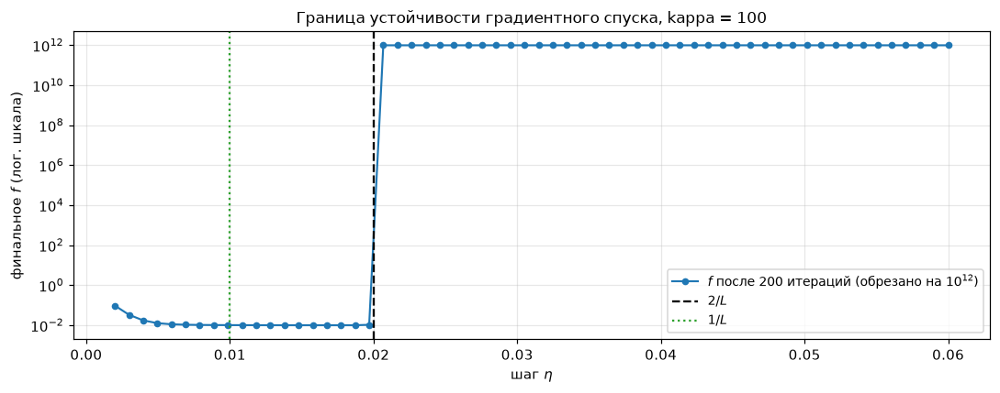

In [35]:
def divergence_threshold_solution(
    X: np.ndarray, y: np.ndarray, lr_grid: np.ndarray
) -> tuple[float, pd.DataFrame]:
    """Минимальный шаг из сетки, при котором GD перестаёт убывать."""
    f, grad = make_objective(X, y, loss="mse")
    x0 = np.ones(X.shape[1])
    f0 = f(x0)
    rows = []
    for lr in lr_grid:
        _, hist = gradient_descent(f, grad, x0, lr=float(lr), n_iter=200, tol=1e-12)
        f_end = hist["f"][-1]
        rows.append(
            {
                "шаг": float(lr),
                "финальное f": f_end,
                "расходится": (not np.isfinite(f_end)) or f_end > f0,
            }
        )
    df = pd.DataFrame(rows)
    diverged = df.loc[df["расходится"], "шаг"]
    return (float(diverged.min()) if len(diverged) else float("inf")), df


X_s3, y_s3, _ = make_regression_data(300, 5, np.random.default_rng(SEED), kappa=100.0)
L_s3 = float(np.linalg.eigvalsh(mse_hessian(X_s3)).max())
lr_grid_s3 = np.linspace(0.1, 3.0, 60) * (2.0 / L_s3)
lr_star, df_s3 = divergence_threshold_solution(X_s3, y_s3, lr_grid_s3)
print(f"порог по сетке: {lr_star:.6f}")
print(f"теория 2/L:     {2.0 / L_s3:.6f}")
print(f"отношение:      {lr_star / (2.0 / L_s3):.4f}")

fig, ax = plt.subplots(figsize=(10, 4))
# при расходимости f достигает 1e280 и выше: обрезаем сверху, иначе шкала нечитаема
f_plot = np.clip(df_s3["финальное f"].to_numpy(dtype=float), 1e-16, 1e12)
ax.semilogy(
    df_s3["шаг"],
    f_plot,
    color=PALETTE[0],
    marker="o",
    ms=4,
    lw=1.4,
    label="$f$ после 200 итераций (обрезано на $10^{12}$)",
)
ax.axvline(2.0 / L_s3, color="k", ls="--", lw=1.5, label="$2/L$")
ax.axvline(1.0 / L_s3, color="#2ca02c", ls=":", lw=1.5, label="$1/L$")
ax.set_xlabel("шаг $\\eta$")
ax.set_ylabel("финальное $f$ (лог. шкала)")
ax.set_title("Граница устойчивости градиентного спуска, kappa = 100")
ax.legend()
fig.tight_layout()
plt.show()

Порог, найденный перебором, совпадает с $2/L$ с точностью до шага сетки — это не совпадение, а точная граница для квадратичной задачи.
В собственном базисе гессиана GD действует покоординатно как умножение на $(1 - \eta\lambda_i)$; чтобы ошибка убывала по всем координатам, нужно $|1-\eta\lambda_i|<1$ для всех $i$, а самое строгое условие даёт $\lambda_{\max} = L$.
Минимум финального $f$ достигается не на границе, а около $\eta \approx 2/(L+\mu)$: у самой границы «быстрая» координата начинает колебаться с множителем, близким к $-1$, и сходимость снова портится.


### Решение задачи 4


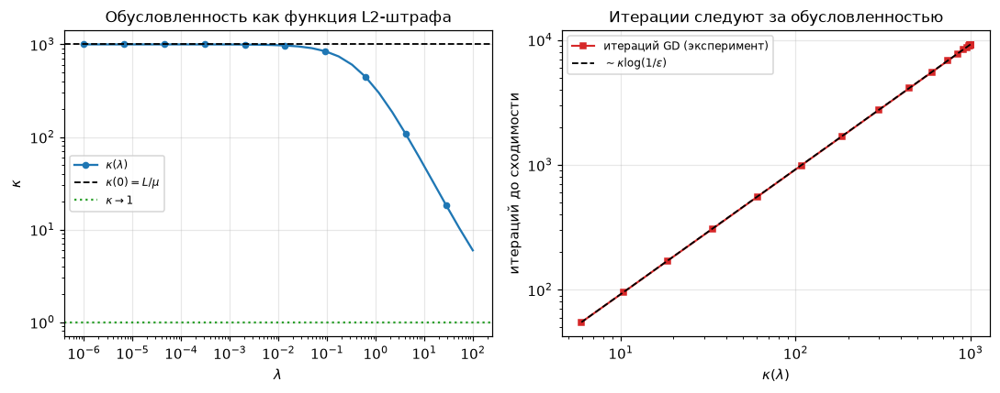

In [36]:
def kappa_vs_lambda_solution(X: np.ndarray, lambdas: np.ndarray) -> np.ndarray:
    """kappa(lambda) для гессиана (2/n) X^T X + 2 lambda I."""
    eigs = np.linalg.eigvalsh(mse_hessian(X))
    L, mu = eigs.max(), eigs.min()
    return (L + 2.0 * lambdas) / (mu + 2.0 * lambdas)


X_s4, y_s4, _ = make_regression_data(
    300, 6, np.random.default_rng(SEED), kappa=1000.0, noise=0.1
)
lambdas_s4 = np.logspace(-6.0, 2.0, 30)
kappas_s4 = kappa_vs_lambda_solution(X_s4, lambdas_s4)

# численная проверка: столько же итераций GD, сколько обещает kappa(lambda)
iters_s4 = []
for lam, kap in zip(lambdas_s4, kappas_s4):
    f_s4, g_s4 = make_objective(X_s4, y_s4, loss="mse", l2=float(lam))
    eigs_s4 = np.linalg.eigvalsh(mse_hessian(X_s4)) + 2.0 * lam
    x0_s4 = np.ones(6)
    tol_s4 = 1e-8 * float(np.linalg.norm(g_s4(x0_s4)))
    _, hist_s4 = gradient_descent(
        f_s4,
        g_s4,
        x0_s4,
        lr=2.0 / (eigs_s4.max() + eigs_s4.min()),
        n_iter=40000,
        tol=tol_s4,
    )
    iters_s4.append(hist_s4["n_iter"])

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].loglog(
    lambdas_s4,
    kappas_s4,
    color=PALETTE[0],
    marker="o",
    markevery=3,
    ms=4,
    label=r"$\kappa(\lambda)$",
)
axes[0].axhline(kappas_s4[0], color="k", ls="--", lw=1.2, label=r"$\kappa(0) = L/\mu$")
axes[0].axhline(1.0, color="#2ca02c", ls=":", lw=1.5, label=r"$\kappa \to 1$")
axes[0].set_xlabel(r"$\lambda$")
axes[0].set_ylabel(r"$\kappa$")
axes[0].set_title("Обусловленность как функция L2-штрафа")
axes[0].legend(fontsize=8)

axes[1].loglog(
    kappas_s4,
    iters_s4,
    color=PALETTE[1],
    marker="s",
    ms=4,
    lw=1.4,
    label="итераций GD (эксперимент)",
)
axes[1].loglog(
    kappas_s4,
    np.array(kappas_s4) * np.log(1e8) / 2.0,
    color="k",
    ls="--",
    lw=1.2,
    label=r"$\sim \kappa \log(1/\varepsilon)$",
)
axes[1].set_xlabel(r"$\kappa(\lambda)$")
axes[1].set_ylabel("итераций до сходимости")
axes[1].set_title("Итерации следуют за обусловленностью")
axes[1].legend(fontsize=8)
fig.tight_layout()
plt.show()

$\kappa(\lambda) = \frac{L + 2\lambda}{\mu + 2\lambda}$ монотонно убывает: при $\lambda \ll \mu$ регуляризация ничего не меняет и $\kappa \approx L/\mu$, при $\lambda \gg L$ оба собственных числа определяются штрафом и $\kappa \to 1$ — задача становится идеально круглой.
Правый график показывает главное: число итераций GD ложится на прямую в координатах $(\kappa, k)$ с наклоном 1, то есть эксперимент воспроизводит оценку $k = O(\kappa\log\frac1\varepsilon)$.
Важно, что регуляризация ускоряет обучение не бесплатно: с ростом $\lambda$ решение смещается к нулю, поэтому $\lambda$ выбирают по качеству на валидации, а не по числу итераций.
